<a href="https://www.kaggle.com/code/lalit7881/smart-city-traffic-urban-mobility-eda-xgb?scriptVersionId=349451045" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/mobeenfatimah/cityflow-smart-urban-mobility-and-traffic-iot/smart_city_traffic_mobility.csv


## Loading dataset

In [2]:
df = pd.read_csv("/kaggle/input/datasets/mobeenfatimah/cityflow-smart-urban-mobility-and-traffic-iot/smart_city_traffic_mobility.csv")

In [3]:
df.head()

,record_id,city_zone,road_id,intersection_id,latitude,longitude,road_type,lanes,speed_limit,vehicle_count,...,traffic_camera_count,iot_sensor_health,signal_cycle_seconds,green_light_duration,emergency_vehicle_detected,traffic_flow_rate,congestion_score,emission_estimate,fuel_waste_estimate,congestion_level
0,REC_0000001,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,162,...,1,Optimal,60,18,0,162.0,16.8,39.14,8.53,Low
1,REC_0000002,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,150,...,1,Optimal,60,18,0,150.0,18.4,36.09,7.83,Low
2,REC_0000003,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,186,...,1,Optimal,60,18,0,186.0,20.7,44.01,9.39,Low
3,REC_0000004,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,162,...,1,Optimal,60,18,0,162.0,17.8,38.47,8.24,Low
4,REC_0000005,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,168,...,1,Optimal,60,18,0,168.0,17.3,40.28,8.71,Low


In [4]:
df.tail()

,record_id,city_zone,road_id,intersection_id,latitude,longitude,road_type,lanes,speed_limit,vehicle_count,...,traffic_camera_count,iot_sensor_health,signal_cycle_seconds,green_light_duration,emergency_vehicle_detected,traffic_flow_rate,congestion_score,emission_estimate,fuel_waste_estimate,congestion_level
203995,REC_0203996,Residential West,RD_281,INT_100,40.665597,-74.039096,Local Street,2,40,224,...,3,Optimal,60,19,0,224.0,22.5,53.10,11.35,Low
203996,REC_0203997,Residential West,RD_281,INT_100,40.665597,-74.039096,Local Street,2,40,125,...,3,Optimal,60,18,0,125.0,16.6,29.62,6.33,Low
203997,REC_0203998,Residential West,RD_281,INT_100,40.665597,-74.039096,Local Street,2,40,111,...,3,Optimal,60,18,0,111.0,23.0,28.54,6.59,Low
203998,REC_0203999,Residential West,RD_281,INT_100,40.665597,-74.039096,Local Street,2,40,100,...,3,Optimal,60,18,0,100.0,12.2,25.74,5.95,Low
203999,REC_0204000,Residential West,RD_281,INT_100,40.665597,-74.039096,Local Street,2,40,114,...,3,Optimal,60,18,0,114.0,24.2,27.24,5.87,Low


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204000 entries, 0 to 203999
Data columns (total 47 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   record_id                   204000 non-null  object 
 1   city_zone                   204000 non-null  object 
 2   road_id                     204000 non-null  object 
 3   intersection_id             204000 non-null  object 
 4   latitude                    204000 non-null  float64
 5   longitude                   204000 non-null  float64
 6   road_type                   204000 non-null  object 
 7   lanes                       204000 non-null  int64  
 8   speed_limit                 204000 non-null  int64  
 9   vehicle_count               204000 non-null  int64  
 10  average_speed               204000 non-null  float64
 11  heavy_vehicle_count         204000 non-null  int64  
 12  motorcycle_count            204000 non-null  int64  
 13  public_transpo

In [6]:
df.describe()

,latitude,longitude,lanes,speed_limit,vehicle_count,average_speed,heavy_vehicle_count,motorcycle_count,public_transport_count,traffic_density,...,public_event,accident_reported,traffic_camera_count,signal_cycle_seconds,green_light_duration,emergency_vehicle_detected,traffic_flow_rate,congestion_score,emission_estimate,fuel_waste_estimate
count,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,...,204000.000000,204000.00000,204000.00000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.00000
mean,40.716219,-74.004859,2.750000,56.700000,749.585907,42.235582,36.969373,74.478319,21.959971,90.660393,...,0.039309,0.01975,2.37000,75.174118,39.070775,0.020049,749.585907,50.007555,257.416941,72.49638
std,0.044876,0.044211,0.726294,17.609984,754.542368,22.214697,41.987095,81.489370,25.773987,85.277658,...,0.194329,0.13914,1.12832,26.080578,27.153351,0.140168,754.542368,38.798606,339.096417,111.51992
min,40.636691,-74.083673,2.000000,40.000000,54.000000,5.000000,1.000000,3.000000,0.000000,9.000000,...,0.000000,0.00000,1.00000,60.000000,18.000000,0.000000,54.000000,5.400000,12.740000,2.71000
25%,40.676753,-74.041839,2.000000,40.000000,171.000000,27.700000,7.000000,16.000000,4.000000,20.800000,...,0.000000,0.00000,1.00000,60.000000,18.000000,0.000000,171.000000,15.200000,41.250000,8.95000
50%,40.721824,-74.001825,3.000000,60.000000,308.000000,40.000000,16.000000,32.000000,9.000000,35.700000,...,0.000000,0.00000,2.00000,60.000000,23.000000,0.000000,308.000000,25.100000,74.070000,16.02000
75%,40.753293,-73.972532,3.000000,60.000000,1208.000000,58.100000,56.000000,117.000000,33.000000,175.100000,...,0.000000,0.00000,3.00000,120.000000,84.000000,0.000000,1208.000000,100.000000,376.840000,98.48000
max,40.790642,-73.928036,4.000000,90.000000,3162.000000,90.000000,246.000000,468.000000,156.000000,378.500000,...,1.000000,1.00000,4.00000,120.000000,84.000000,1.000000,3162.000000,100.000000,9717.220000,4066.07000


In [7]:
df.isnull().sum()

record_id                     0
city_zone                     0
road_id                       0
intersection_id               0
latitude                      0
longitude                     0
road_type                     0
lanes                         0
speed_limit                   0
vehicle_count                 0
average_speed                 0
heavy_vehicle_count           0
motorcycle_count              0
public_transport_count        0
traffic_density               0
queue_length                  0
average_wait_time             0
timestamp                     0
hour                          0
day_of_week                   0
is_weekend                    0
is_holiday                    0
rush_hour                     0
peak_period                   0
temperature                   0
rainfall_mm                   0
visibility_km                 0
air_quality_index             0
weather_condition             0
nearby_school                 0
nearby_hospital               0
nearby_m

In [8]:
df.duplicated().sum()

np.int64(0)

In [9]:
df.dtypes

record_id                      object
city_zone                      object
road_id                        object
intersection_id                object
latitude                      float64
longitude                     float64
road_type                      object
lanes                           int64
speed_limit                     int64
vehicle_count                   int64
average_speed                 float64
heavy_vehicle_count             int64
motorcycle_count                int64
public_transport_count          int64
traffic_density               float64
queue_length                  float64
average_wait_time             float64
timestamp                      object
hour                            int64
day_of_week                     int64
is_weekend                      int64
is_holiday                      int64
rush_hour                       int64
peak_period                    object
temperature                   float64
rainfall_mm                   float64
visibility_k

In [10]:
df.shape

(204000, 47)

In [11]:
df.columns

Index(['record_id', 'city_zone', 'road_id', 'intersection_id', 'latitude',
       'longitude', 'road_type', 'lanes', 'speed_limit', 'vehicle_count',
       'average_speed', 'heavy_vehicle_count', 'motorcycle_count',
       'public_transport_count', 'traffic_density', 'queue_length',
       'average_wait_time', 'timestamp', 'hour', 'day_of_week', 'is_weekend',
       'is_holiday', 'rush_hour', 'peak_period', 'temperature', 'rainfall_mm',
       'visibility_km', 'air_quality_index', 'weather_condition',
       'nearby_school', 'nearby_hospital', 'nearby_market',
       'construction_activity', 'road_condition', 'parking_occupancy',
       'public_event', 'accident_reported', 'traffic_camera_count',
       'iot_sensor_health', 'signal_cycle_seconds', 'green_light_duration',
       'emergency_vehicle_detected', 'traffic_flow_rate', 'congestion_score',
       'emission_estimate', 'fuel_waste_estimate', 'congestion_level'],
      dtype='object')

In [12]:
df.nunique()

record_id                     204000
city_zone                          6
road_id                           94
intersection_id                  100
latitude                         100
longitude                        100
road_type                          4
lanes                              3
speed_limit                        3
vehicle_count                   3058
average_speed                    851
heavy_vehicle_count              246
motorcycle_count                 462
public_transport_count           157
traffic_density                 3161
queue_length                    9712
average_wait_time               1855
timestamp                       2040
hour                              24
day_of_week                        7
is_weekend                         2
is_holiday                         2
rush_hour                          2
peak_period                        5
temperature                      343
rainfall_mm                      194
visibility_km                     96
a

## EDA

TRAFFIC DATASET VISUALIZATION

Dataset Shape:
(204000, 47)

Columns:
['record_id', 'city_zone', 'road_id', 'intersection_id', 'latitude', 'longitude', 'road_type', 'lanes', 'speed_limit', 'vehicle_count', 'average_speed', 'heavy_vehicle_count', 'motorcycle_count', 'public_transport_count', 'traffic_density', 'queue_length', 'average_wait_time', 'timestamp', 'hour', 'day_of_week', 'is_weekend', 'is_holiday', 'rush_hour', 'peak_period', 'temperature', 'rainfall_mm', 'visibility_km', 'air_quality_index', 'weather_condition', 'nearby_school', 'nearby_hospital', 'nearby_market', 'construction_activity', 'road_condition', 'parking_occupancy', 'public_event', 'accident_reported', 'traffic_camera_count', 'iot_sensor_health', 'signal_cycle_seconds', 'green_light_duration', 'emergency_vehicle_detected', 'traffic_flow_rate', 'congestion_score', 'emission_estimate', 'fuel_waste_estimate', 'congestion_level']

First 5 Rows:


,record_id,city_zone,road_id,intersection_id,latitude,longitude,road_type,lanes,speed_limit,vehicle_count,average_speed,heavy_vehicle_count,motorcycle_count,public_transport_count,traffic_density,queue_length,average_wait_time,timestamp,hour,day_of_week,is_weekend,is_holiday,rush_hour,peak_period,temperature,rainfall_mm,visibility_km,air_quality_index,weather_condition,nearby_school,nearby_hospital,nearby_market,construction_activity,road_condition,parking_occupancy,public_event,accident_reported,traffic_camera_count,iot_sensor_health,signal_cycle_seconds,green_light_duration,emergency_vehicle_detected,traffic_flow_rate,congestion_score,emission_estimate,fuel_waste_estimate,congestion_level
0,REC_0000001,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,162,40.0,12,9,7,27.0,14.3,1.6,2026-01-01 00:00:00,0,3,0,0,0,Night,11.1,0.0,10.0,52,Clear,0,0,0,1,Poor,40.5,0,0,1,Optimal,60,18,0,162.0,16.8,39.14,8.53,Low
1,REC_0000002,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,150,37.7,8,12,5,25.0,12.0,1.3,2026-01-01 01:00:00,1,3,0,0,0,Night,18.2,0.0,10.0,58,Clear,0,0,0,0,Good,48.8,0,0,1,Optimal,60,18,0,150.0,18.4,36.09,7.83,Low
2,REC_0000003,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,186,38.4,13,12,6,31.0,2.5,0.3,2026-01-01 02:00:00,2,3,0,0,0,Night,22.0,0.0,10.0,39,Clear,0,0,0,0,Good,64.1,1,0,1,Optimal,60,18,0,186.0,20.7,44.01,9.39,Low
3,REC_0000004,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,162,38.9,7,11,7,27.0,6.0,0.5,2026-01-01 03:00:00,3,3,0,0,0,Night,20.5,0.0,10.0,57,Clear,0,0,0,0,Good,75.4,0,0,1,Optimal,60,18,0,162.0,17.8,38.47,8.24,Low
4,REC_0000005,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,168,40.0,8,12,6,28.0,13.4,1.1,2026-01-01 04:00:00,4,3,0,0,0,Night,25.9,0.0,9.9,51,Clear,0,0,0,0,Good,79.6,0,0,1,Optimal,60,18,0,168.0,17.3,40.28,8.71,Low



Missing Values:


,Missing Values
record_id,0
city_zone,0
road_id,0
intersection_id,0
latitude,0
longitude,0
road_type,0
lanes,0
speed_limit,0
vehicle_count,0



Data Types:


,Data Type
record_id,object
city_zone,object
road_id,object
intersection_id,object
latitude,float64
longitude,float64
road_type,object
lanes,int64
speed_limit,int64
vehicle_count,int64



Numerical Columns:
['latitude', 'longitude', 'lanes', 'speed_limit', 'vehicle_count', 'average_speed', 'heavy_vehicle_count', 'motorcycle_count', 'public_transport_count', 'traffic_density', 'queue_length', 'average_wait_time', 'hour', 'day_of_week', 'is_weekend', 'is_holiday', 'rush_hour', 'temperature', 'rainfall_mm', 'visibility_km', 'air_quality_index', 'nearby_school', 'nearby_hospital', 'nearby_market', 'construction_activity', 'parking_occupancy', 'public_event', 'accident_reported', 'traffic_camera_count', 'signal_cycle_seconds', 'green_light_duration', 'emergency_vehicle_detected', 'traffic_flow_rate', 'congestion_score', 'emission_estimate', 'fuel_waste_estimate']

Categorical Columns:
['record_id', 'city_zone', 'road_id', 'intersection_id', 'road_type', 'timestamp', 'peak_period', 'weather_condition', 'road_condition', 'iot_sensor_health', 'congestion_level']

DESCRIPTIVE STATISTICS


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
record_id,204000,204000,REC_0203984,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
city_zone,204000,6,Suburban North,53040,NaN,NaN,NaN,NaN,NaN,NaN,NaN
road_id,204000,94,RD_332,6120,NaN,NaN,NaN,NaN,NaN,NaN,NaN
intersection_id,204000,100,INT_001,2040,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,204000.0,NaN,NaN,NaN,40.716219,0.044876,40.636691,40.676753,40.721824,40.753293,40.790642
longitude,204000.0,NaN,NaN,NaN,-74.004859,0.044211,-74.083673,-74.041839,-74.001825,-73.972532,-73.928036
road_type,204000,4,Arterial,83640,NaN,NaN,NaN,NaN,NaN,NaN,NaN
lanes,204000.0,NaN,NaN,NaN,2.75,0.726294,2.0,2.0,3.0,3.0,4.0
speed_limit,204000.0,NaN,NaN,NaN,56.7,17.609984,40.0,40.0,60.0,60.0,90.0
vehicle_count,204000.0,NaN,NaN,NaN,749.585907,754.542368,54.0,171.0,308.0,1208.0,3162.0



No missing values found.


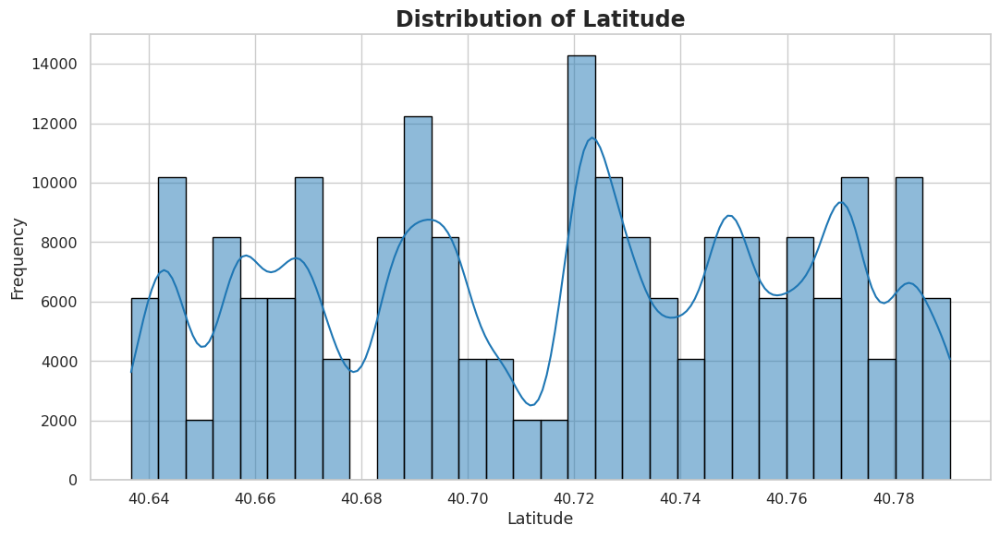

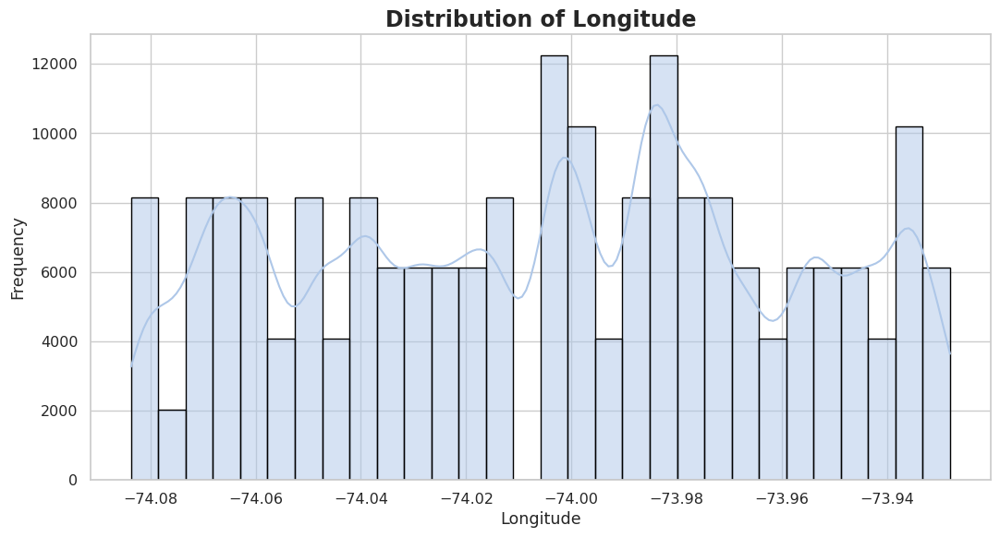

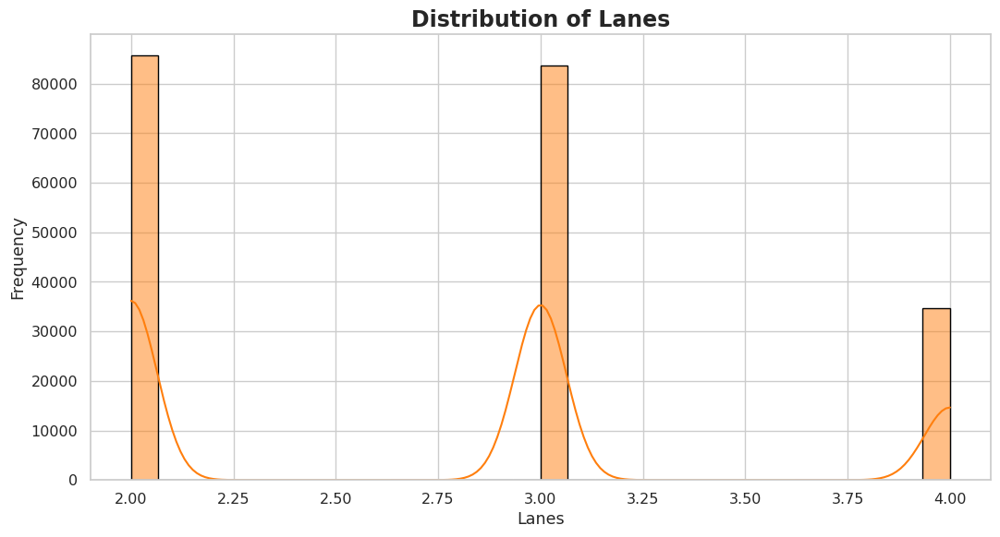

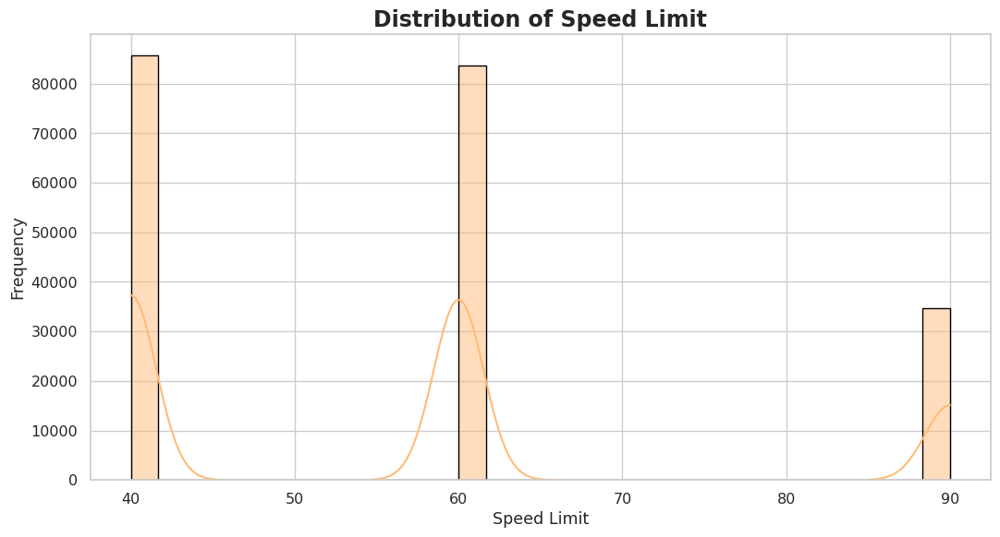

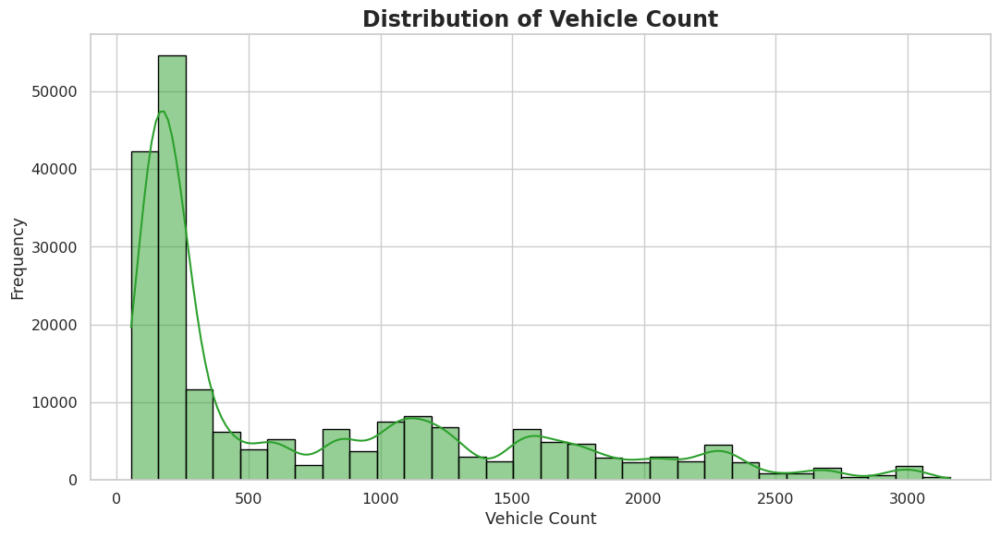

...

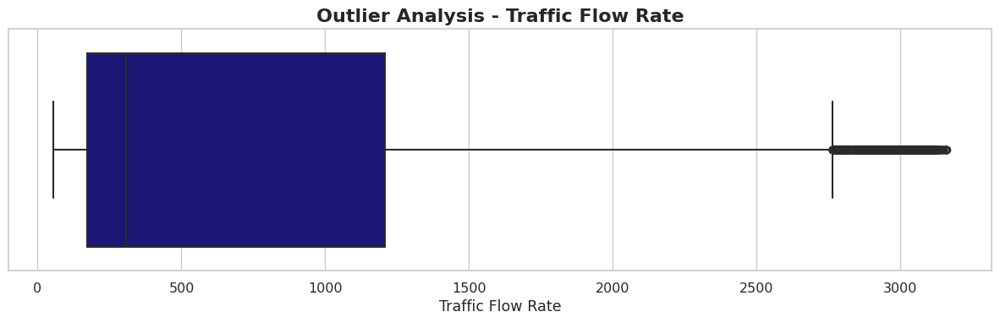

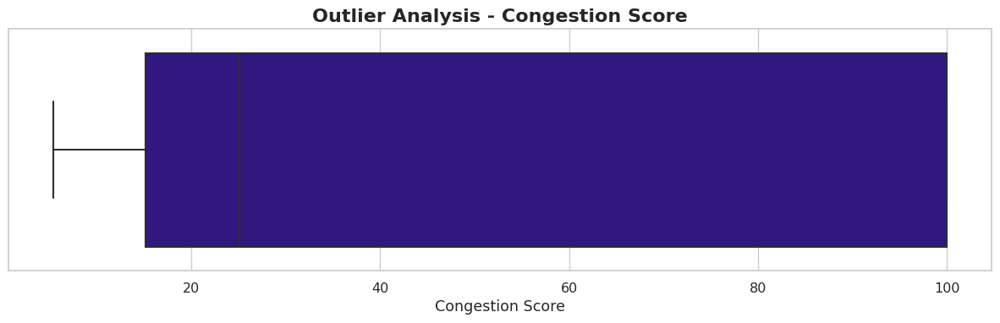

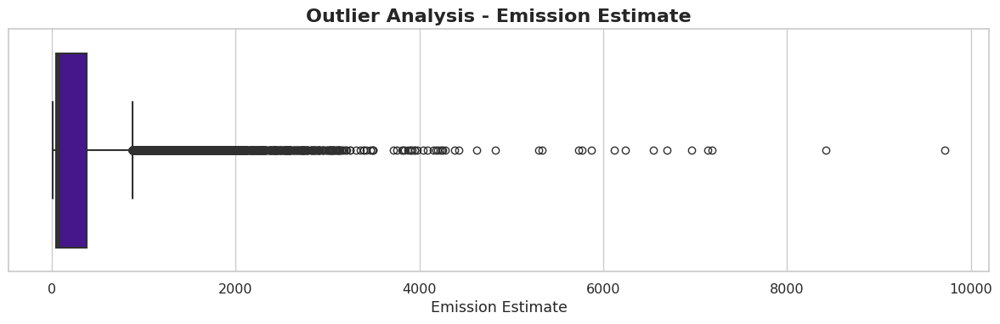

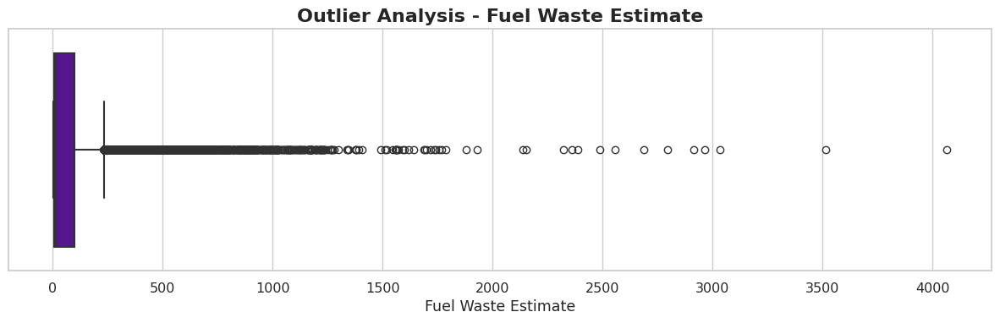

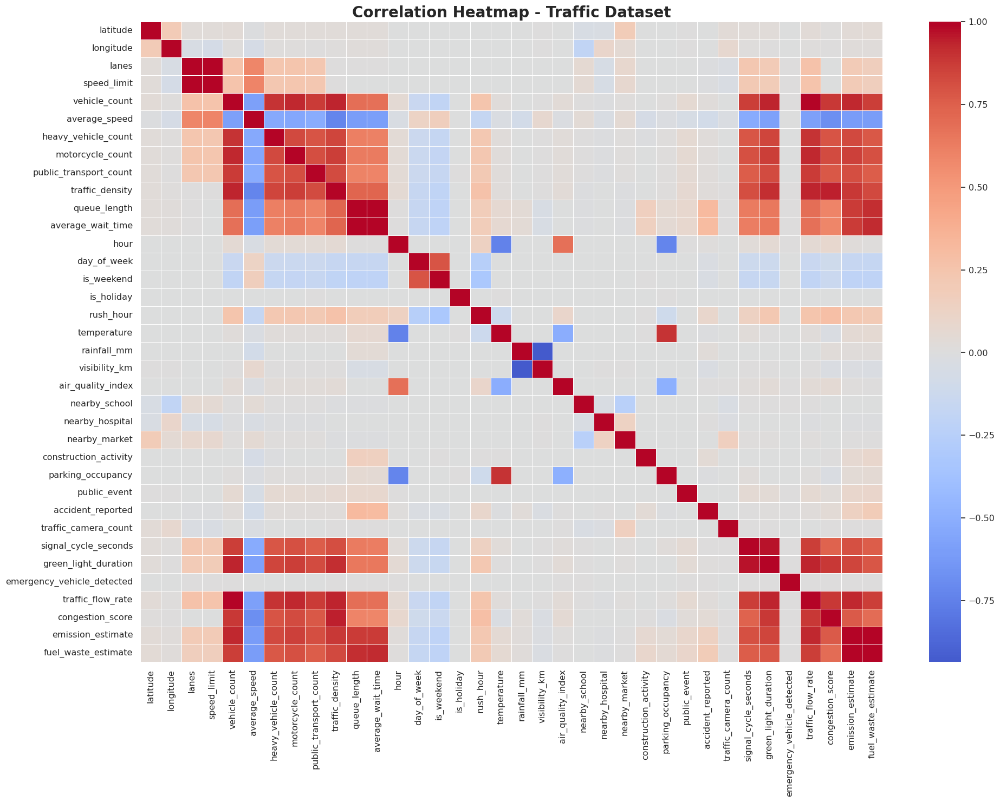


Correlation with Congestion Score:


,Correlation
average_speed,-0.680453
is_weekend,-0.137137
day_of_week,-0.108071
parking_occupancy,-0.027908
visibility_km,-0.027635
temperature,-0.021508
nearby_school,-0.004713
nearby_market,-0.003453
is_holiday,-0.000157
nearby_hospital,0.000292


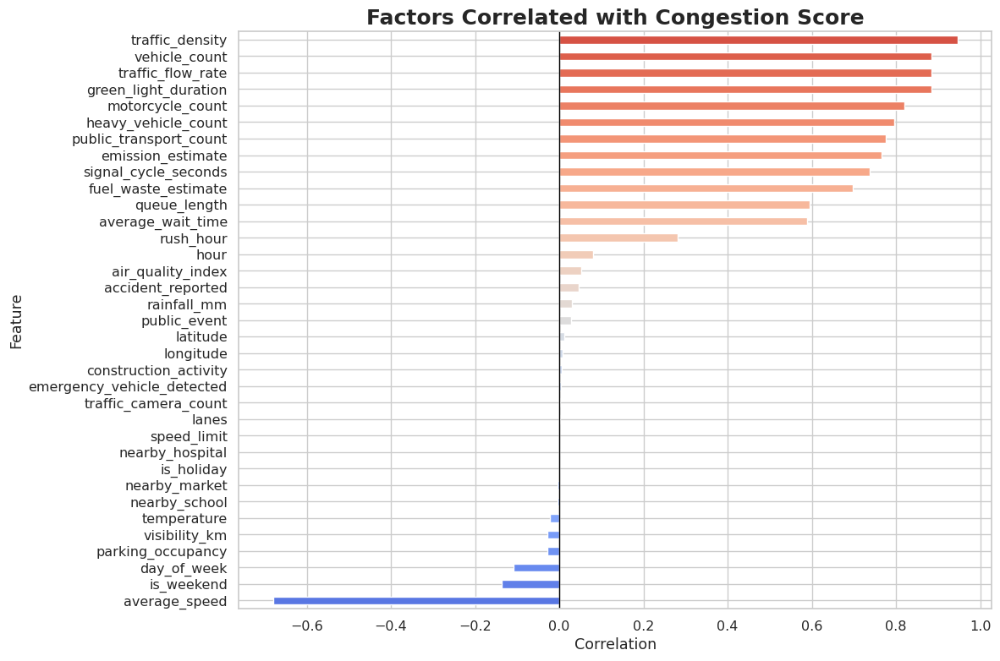

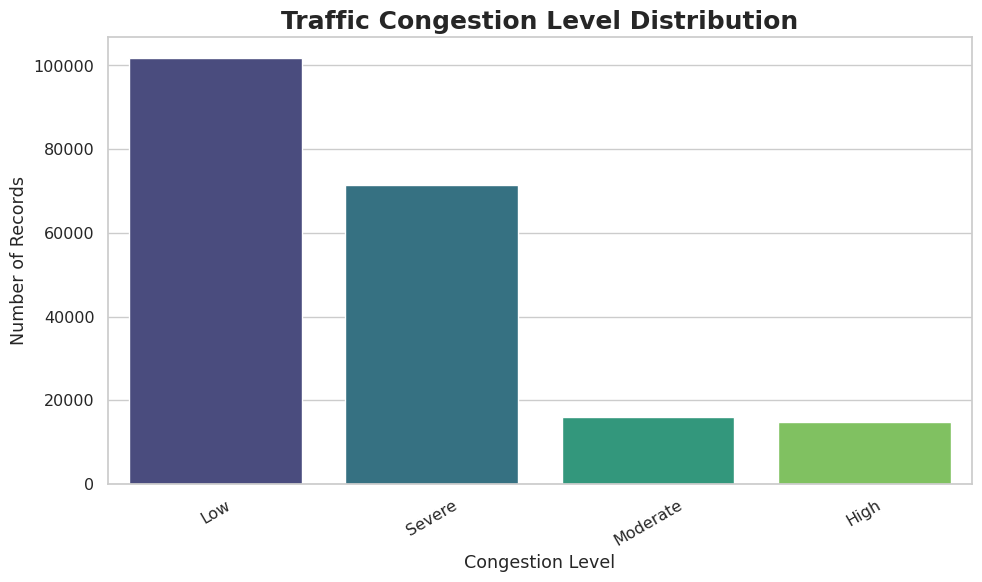


Congestion Level Counts:


,Count
congestion_level,
Low,101679
Severe,71497
Moderate,15976
High,14848


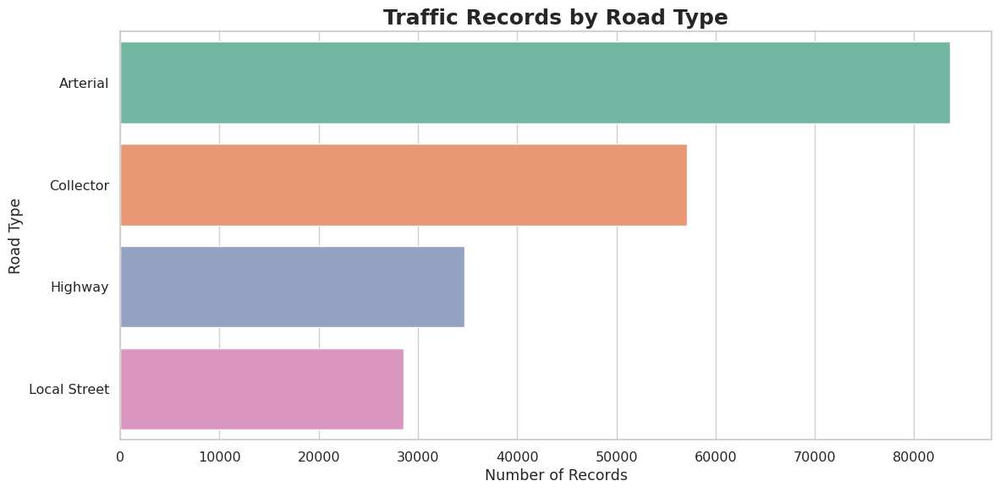

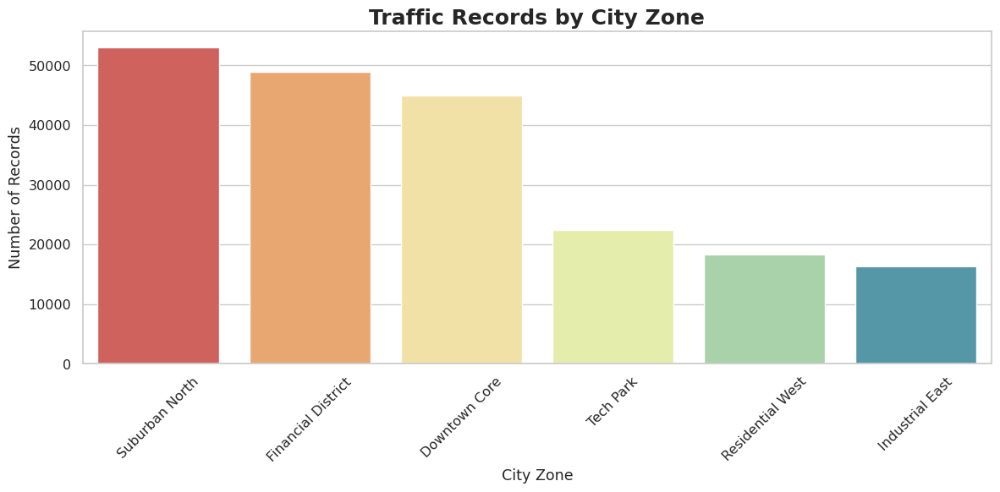

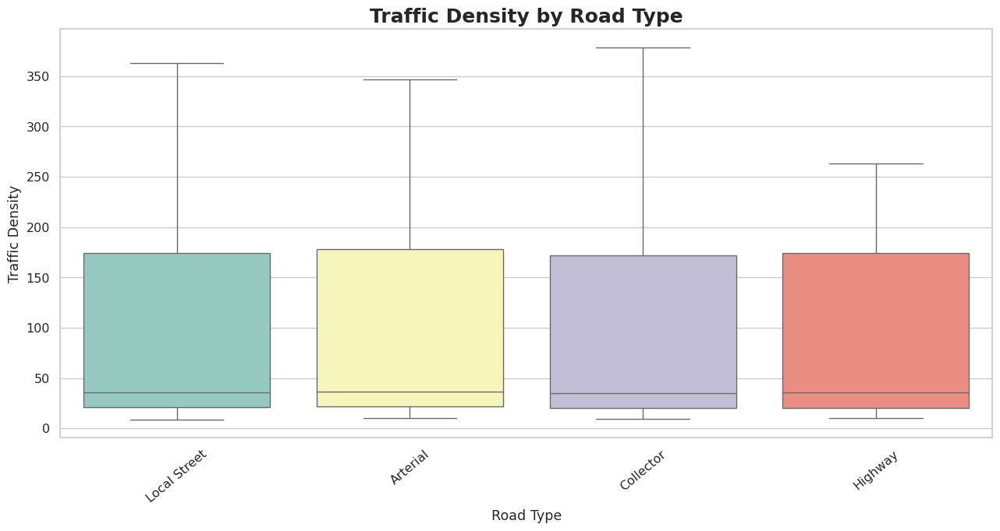

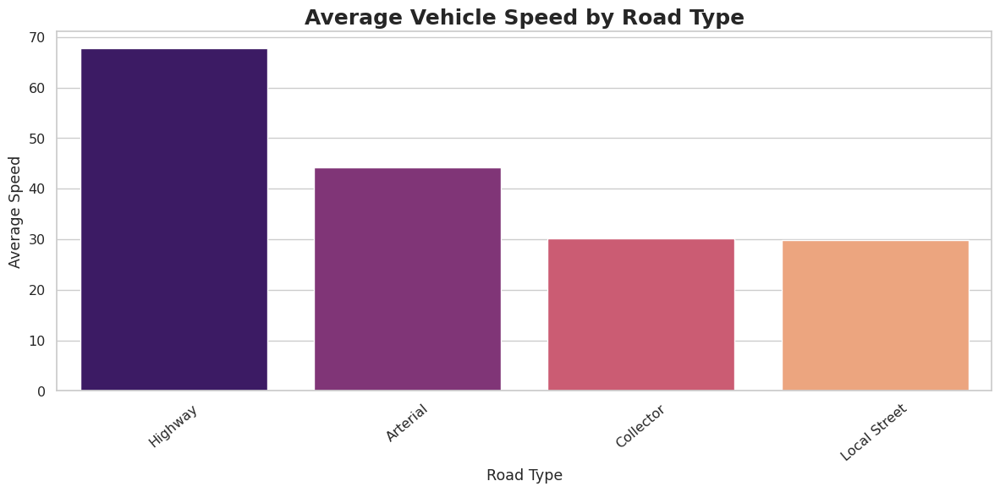

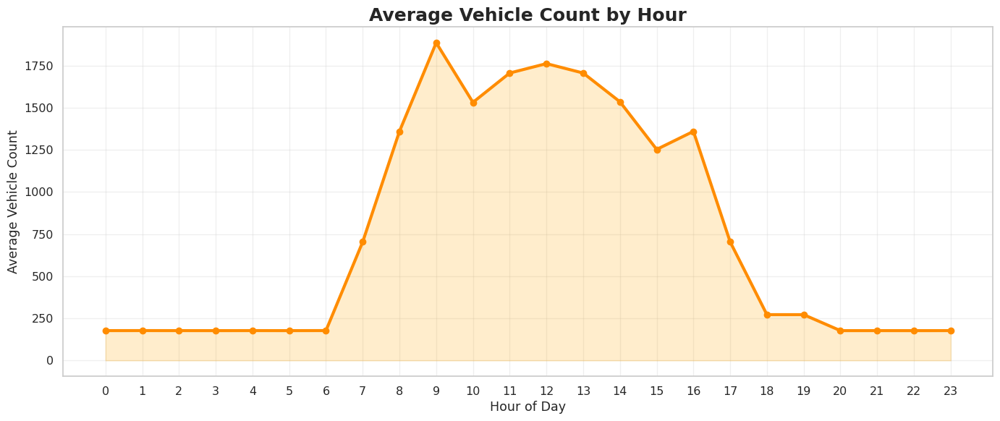

...

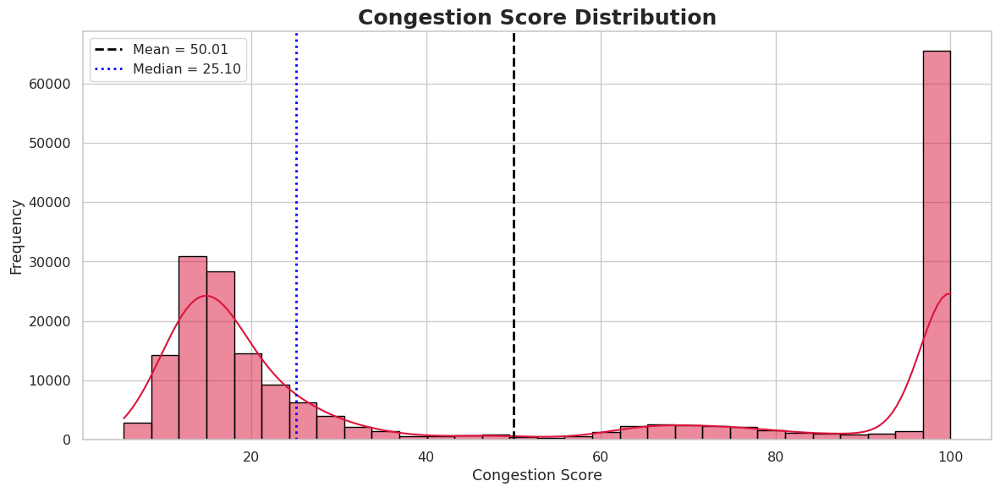

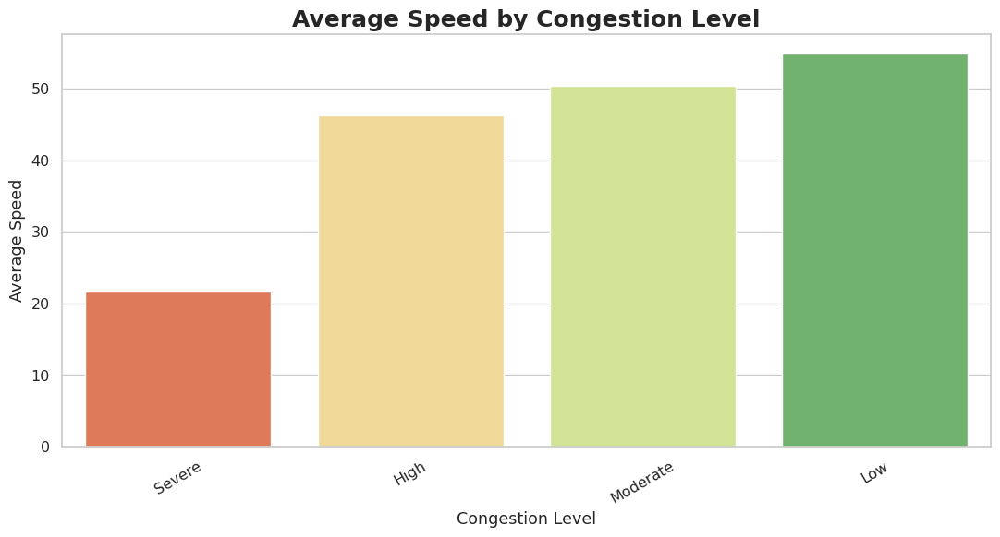

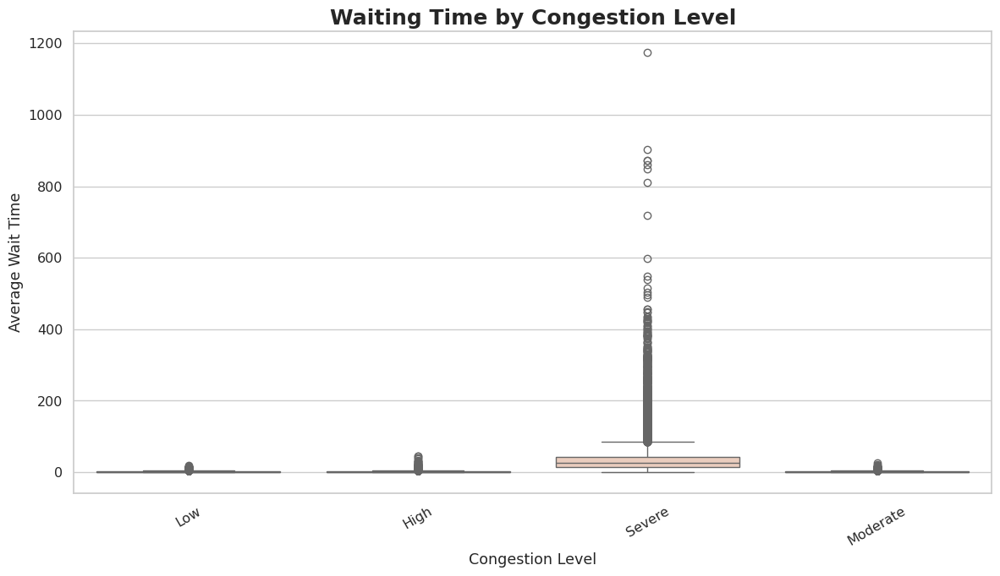

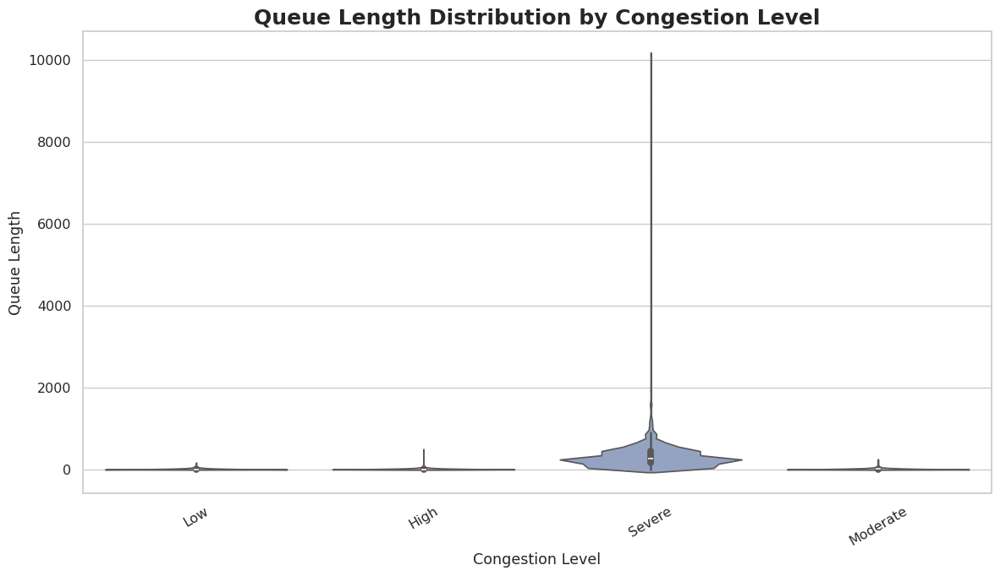

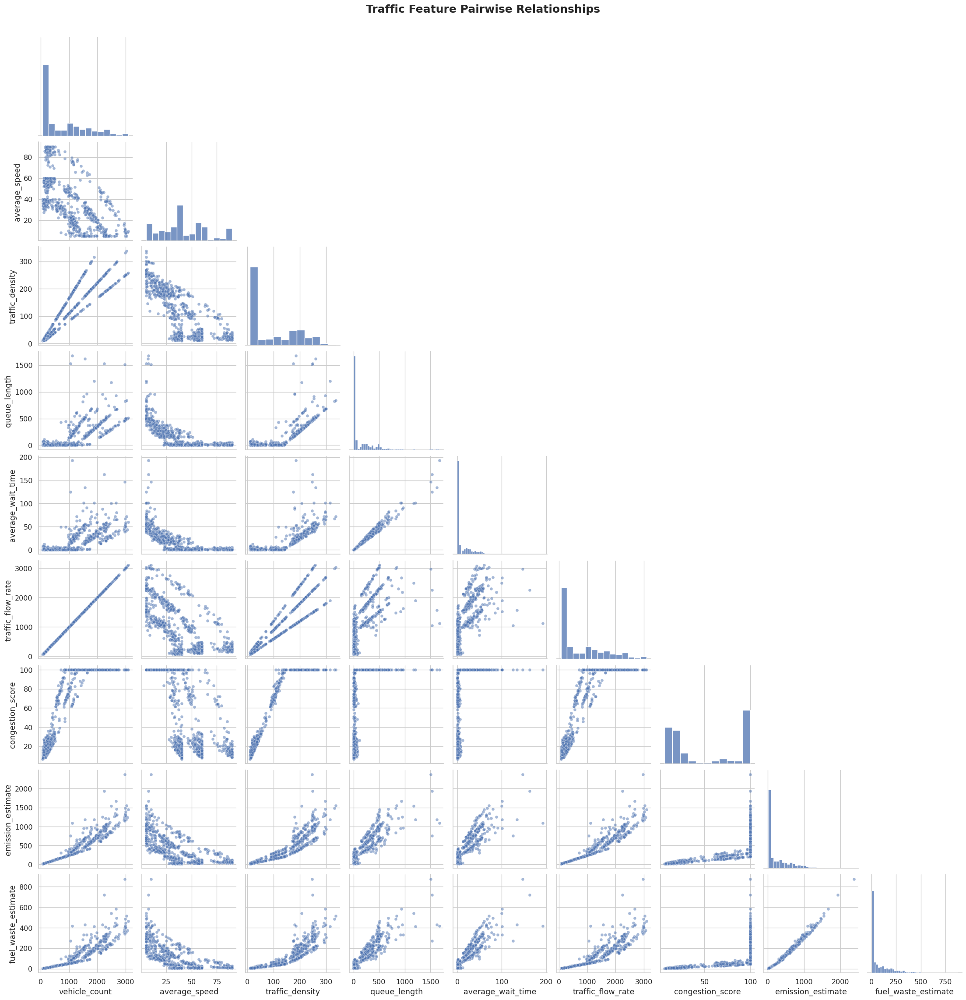



TRAFFIC KPI SUMMARY
Average Vehicle Count     : 749.59
Average Speed             : 42.24
Average Traffic Density   : 90.66
Average Queue Length      : 121.47
Average Wait Time         : 12.15
Average Congestion Score  : 50.01
Average Emission Estimate : 257.42
Average Fuel Waste        : 72.50
VISUALIZATION COMPLETED


In [13]:

# ------------------------------------------------------------
# DISPLAY SETTINGS
# ------------------------------------------------------------

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)

sns.set_theme(style="whitegrid", font_scale=1.05)

print("=" * 80)
print("TRAFFIC DATASET VISUALIZATION")
print("=" * 80)

print("\nDataset Shape:")
print(df.shape)

print("\nColumns:")
print(df.columns.tolist())

print("\nFirst 5 Rows:")
display(df.head())

print("\nMissing Values:")
display(df.isnull().sum().sort_values(ascending=False).to_frame("Missing Values"))

print("\nData Types:")
display(df.dtypes.to_frame("Data Type"))


# ============================================================
# 1. NUMERICAL COLUMN IDENTIFICATION
# ============================================================

numeric_cols = df.select_dtypes(include=np.number).columns.tolist()

categorical_cols = df.select_dtypes(
    include=["object", "category", "bool"]
).columns.tolist()

print("\nNumerical Columns:")
print(numeric_cols)

print("\nCategorical Columns:")
print(categorical_cols)


# ============================================================
# 2. DATASET SUMMARY
# ============================================================

print("\n" + "=" * 80)
print("DESCRIPTIVE STATISTICS")
print("=" * 80)

display(df.describe(include="all").T)


# ============================================================
# 3. MISSING VALUES VISUALIZATION
# ============================================================

missing = df.isnull().sum()
missing = missing[missing > 0].sort_values(ascending=False)

if len(missing) > 0:

    plt.figure(figsize=(14, 7))

    bars = plt.bar(
        missing.index,
        missing.values,
        color=plt.cm.viridis(
            np.linspace(0.1, 0.9, len(missing))
        )
    )

    plt.title(
        "Missing Values by Column",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Columns")
    plt.ylabel("Number of Missing Values")
    plt.xticks(rotation=75)

    for bar, value in zip(bars, missing.values):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            str(value),
            ha="center",
            va="bottom",
            fontsize=9
        )

    plt.tight_layout()
    plt.show()

else:
    print("\nNo missing values found.")


# ============================================================
# 4. NUMERICAL DISTRIBUTIONS
# ============================================================

distribution_cols = [
    "latitude",
    "longitude",
    "lanes",
    "speed_limit",
    "vehicle_count",
    "average_speed",
    "heavy_vehicle_count",
    "motorcycle_count",
    "public_transport_count",
    "traffic_density",
    "queue_length",
    "average_wait_time",
    "temperature",
    "rainfall_mm",
    "visibility_km",
    "air_quality_index",
    "parking_occupancy",
    "traffic_camera_count",
    "signal_cycle_seconds",
    "green_light_duration",
    "traffic_flow_rate",
    "congestion_score",
    "emission_estimate",
    "fuel_waste_estimate"
]

distribution_cols = [
    col for col in distribution_cols
    if col in df.columns
]


# ------------------------------------------------------------
# Individual Histograms
# ------------------------------------------------------------

for i, col in enumerate(distribution_cols):

    plt.figure(figsize=(11, 6))

    color = plt.cm.tab20(
        (i % 20) / 20
    )

    sns.histplot(
        df[col].dropna(),
        bins=30,
        kde=True,
        color=color,
        edgecolor="black"
    )

    plt.title(
        f"Distribution of {col.replace('_', ' ').title()}",
        fontsize=17,
        fontweight="bold"
    )

    plt.xlabel(col.replace("_", " ").title())
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()


# ============================================================
# 5. BOXPLOTS - OUTLIER ANALYSIS
# ============================================================

for i, col in enumerate(distribution_cols):

    plt.figure(figsize=(12, 4))

    color = plt.cm.plasma(
        (i % 20) / 20
    )

    sns.boxplot(
        x=df[col],
        color=color,
        linewidth=1.5
    )

    plt.title(
        f"Outlier Analysis - {col.replace('_', ' ').title()}",
        fontsize=16,
        fontweight="bold"
    )

    plt.xlabel(col.replace("_", " ").title())

    plt.tight_layout()
    plt.show()


# ============================================================
# 6. CORRELATION HEATMAP
# ============================================================

if len(numeric_cols) > 1:

    correlation = df[numeric_cols].corr()

    plt.figure(figsize=(20, 15))

    sns.heatmap(
        correlation,
        cmap="coolwarm",
        center=0,
        linewidths=0.5,
        annot=False,
        square=False
    )

    plt.title(
        "Correlation Heatmap - Traffic Dataset",
        fontsize=20,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()


# ============================================================
# 7. TOP CORRELATIONS WITH CONGESTION SCORE
# ============================================================

if "congestion_score" in df.columns:

    congestion_corr = (
        df[numeric_cols]
        .corr()["congestion_score"]
        .drop("congestion_score")
        .sort_values()
    )

    print("\nCorrelation with Congestion Score:")
    display(
        congestion_corr.to_frame("Correlation")
    )

    plt.figure(figsize=(12, 8))

    congestion_corr.plot(
        kind="barh",
        color=plt.cm.coolwarm(
            np.linspace(0.1, 0.9, len(congestion_corr))
        )
    )

    plt.title(
        "Factors Correlated with Congestion Score",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Correlation")
    plt.ylabel("Feature")

    plt.axvline(
        0,
        color="black",
        linewidth=1
    )

    plt.tight_layout()
    plt.show()


# ============================================================
# 8. CONGESTION LEVEL DISTRIBUTION
# ============================================================

if "congestion_level" in df.columns:

    plt.figure(figsize=(10, 6))

    order = df["congestion_level"].value_counts().index

    sns.countplot(
        data=df,
        x="congestion_level",
        order=order,
        palette="viridis"
    )

    plt.title(
        "Traffic Congestion Level Distribution",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Congestion Level")
    plt.ylabel("Number of Records")

    plt.xticks(rotation=30)

    plt.tight_layout()
    plt.show()

    print("\nCongestion Level Counts:")
    display(
        df["congestion_level"]
        .value_counts()
        .to_frame("Count")
    )


# ============================================================
# 9. ROAD TYPE ANALYSIS
# ============================================================

if "road_type" in df.columns:

    plt.figure(figsize=(12, 6))

    road_counts = df["road_type"].value_counts()

    sns.barplot(
        x=road_counts.values,
        y=road_counts.index,
        palette="Set2"
    )

    plt.title(
        "Traffic Records by Road Type",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Number of Records")
    plt.ylabel("Road Type")

    plt.tight_layout()
    plt.show()


# ============================================================
# 10. CITY ZONE ANALYSIS
# ============================================================

if "city_zone" in df.columns:

    plt.figure(figsize=(12, 6))

    zone_counts = df["city_zone"].value_counts()

    sns.barplot(
        x=zone_counts.index,
        y=zone_counts.values,
        palette="Spectral"
    )

    plt.title(
        "Traffic Records by City Zone",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("City Zone")
    plt.ylabel("Number of Records")

    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()


# ============================================================
# 11. TRAFFIC DENSITY BY ROAD TYPE
# ============================================================

if {"road_type", "traffic_density"}.issubset(df.columns):

    plt.figure(figsize=(13, 7))

    sns.boxplot(
        data=df,
        x="road_type",
        y="traffic_density",
        palette="Set3"
    )

    plt.title(
        "Traffic Density by Road Type",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Road Type")
    plt.ylabel("Traffic Density")

    plt.xticks(rotation=40)

    plt.tight_layout()
    plt.show()


# ============================================================
# 12. AVERAGE SPEED BY ROAD TYPE
# ============================================================

if {"road_type", "average_speed"}.issubset(df.columns):

    speed_by_road = (
        df.groupby("road_type")["average_speed"]
        .mean()
        .sort_values(ascending=False)
    )

    plt.figure(figsize=(12, 6))

    sns.barplot(
        x=speed_by_road.index,
        y=speed_by_road.values,
        palette="magma"
    )

    plt.title(
        "Average Vehicle Speed by Road Type",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Road Type")
    plt.ylabel("Average Speed")

    plt.xticks(rotation=40)

    plt.tight_layout()
    plt.show()


# ============================================================
# 13. HOURLY TRAFFIC ANALYSIS
# ============================================================

if {"hour", "vehicle_count"}.issubset(df.columns):

    hourly_traffic = (
        df.groupby("hour")["vehicle_count"]
        .mean()
    )

    plt.figure(figsize=(14, 6))

    plt.plot(
        hourly_traffic.index,
        hourly_traffic.values,
        marker="o",
        linewidth=3,
        color="darkorange"
    )

    plt.fill_between(
        hourly_traffic.index,
        hourly_traffic.values,
        alpha=0.2,
        color="orange"
    )

    plt.title(
        "Average Vehicle Count by Hour",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Hour of Day")
    plt.ylabel("Average Vehicle Count")

    plt.xticks(range(0, 24))

    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


# ============================================================
# 14. HOURLY CONGESTION
# ============================================================

if {"hour", "congestion_score"}.issubset(df.columns):

    hourly_congestion = (
        df.groupby("hour")["congestion_score"]
        .mean()
    )

    plt.figure(figsize=(14, 6))

    plt.plot(
        hourly_congestion.index,
        hourly_congestion.values,
        marker="o",
        linewidth=3,
        color="crimson"
    )

    plt.fill_between(
        hourly_congestion.index,
        hourly_congestion.values,
        alpha=0.15,
        color="red"
    )

    plt.title(
        "Average Congestion Score by Hour",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Hour of Day")
    plt.ylabel("Average Congestion Score")

    plt.xticks(range(0, 24))

    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


# ============================================================
# 15. DAY OF WEEK ANALYSIS
# ============================================================

if {"day_of_week", "vehicle_count"}.issubset(df.columns):

    day_traffic = (
        df.groupby("day_of_week")["vehicle_count"]
        .mean()
    )

    plt.figure(figsize=(12, 6))

    sns.barplot(
        x=day_traffic.index,
        y=day_traffic.values,
        palette="cubehelix"
    )

    plt.title(
        "Average Vehicle Count by Day of Week",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Day of Week")
    plt.ylabel("Average Vehicle Count")

    plt.xticks(rotation=30)

    plt.tight_layout()
    plt.show()


# ============================================================
# 16. WEEKEND VS WEEKDAY
# ============================================================

if {"is_weekend", "congestion_score"}.issubset(df.columns):

    plt.figure(figsize=(9, 6))

    sns.boxplot(
        data=df,
        x="is_weekend",
        y="congestion_score",
        palette="Set1"
    )

    plt.title(
        "Congestion Score: Weekend vs Weekday",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Weekend")
    plt.ylabel("Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 17. RUSH HOUR ANALYSIS
# ============================================================

if {"rush_hour", "congestion_score"}.issubset(df.columns):

    plt.figure(figsize=(10, 6))

    sns.boxplot(
        data=df,
        x="rush_hour",
        y="congestion_score",
        palette="rocket"
    )

    plt.title(
        "Congestion During Rush Hour",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Rush Hour")
    plt.ylabel("Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 18. PEAK PERIOD ANALYSIS
# ============================================================

if {"peak_period", "vehicle_count"}.issubset(df.columns):

    peak_traffic = (
        df.groupby("peak_period")["vehicle_count"]
        .mean()
        .sort_values(ascending=False)
    )

    plt.figure(figsize=(11, 6))

    sns.barplot(
        x=peak_traffic.index,
        y=peak_traffic.values,
        palette="flare"
    )

    plt.title(
        "Average Vehicle Count by Peak Period",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Peak Period")
    plt.ylabel("Average Vehicle Count")

    plt.xticks(rotation=30)

    plt.tight_layout()
    plt.show()


# ============================================================
# 19. WEATHER CONDITION ANALYSIS
# ============================================================

if {"weather_condition", "congestion_score"}.issubset(df.columns):

    weather_congestion = (
        df.groupby("weather_condition")["congestion_score"]
        .mean()
        .sort_values(ascending=False)
    )

    plt.figure(figsize=(12, 7))

    sns.barplot(
        x=weather_congestion.values,
        y=weather_congestion.index,
        palette="YlGnBu"
    )

    plt.title(
        "Average Congestion by Weather Condition",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Average Congestion Score")
    plt.ylabel("Weather Condition")

    plt.tight_layout()
    plt.show()


# ============================================================
# 20. RAINFALL VS CONGESTION
# ============================================================

if {"rainfall_mm", "congestion_score"}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="rainfall_mm",
        y="congestion_score",
        hue="congestion_score",
        palette="turbo",
        size="vehicle_count" if "vehicle_count" in df.columns else None,
        sizes=(20, 200),
        alpha=0.7
    )

    plt.title(
        "Rainfall vs Congestion Score",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Rainfall (mm)")
    plt.ylabel("Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 21. TEMPERATURE VS TRAFFIC
# ============================================================

if {"temperature", "vehicle_count"}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="temperature",
        y="vehicle_count",
        hue="congestion_score"
        if "congestion_score" in df.columns else None,
        palette="Spectral",
        alpha=0.7
    )

    plt.title(
        "Temperature vs Vehicle Count",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Temperature")
    plt.ylabel("Vehicle Count")

    plt.tight_layout()
    plt.show()


# ============================================================
# 22. VISIBILITY VS CONGESTION
# ============================================================

if {"visibility_km", "congestion_score"}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="visibility_km",
        y="congestion_score",
        hue="congestion_score",
        palette="cool",
        alpha=0.7
    )

    plt.title(
        "Visibility vs Congestion Score",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Visibility (km)")
    plt.ylabel("Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 23. AIR QUALITY VS TRAFFIC
# ============================================================

if {"air_quality_index", "vehicle_count"}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="air_quality_index",
        y="vehicle_count",
        hue="congestion_score"
        if "congestion_score" in df.columns else None,
        palette="plasma",
        alpha=0.7
    )

    plt.title(
        "Air Quality Index vs Vehicle Count",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Air Quality Index")
    plt.ylabel("Vehicle Count")

    plt.tight_layout()
    plt.show()


# ============================================================
# 24. VEHICLE COMPOSITION
# ============================================================

vehicle_columns = [
    "vehicle_count",
    "heavy_vehicle_count",
    "motorcycle_count",
    "public_transport_count"
]

vehicle_columns = [
    col for col in vehicle_columns
    if col in df.columns
]

if len(vehicle_columns) >= 2:

    vehicle_totals = df[vehicle_columns].sum().sort_values(
        ascending=False
    )

    plt.figure(figsize=(12, 7))

    plt.pie(
        vehicle_totals.values,
        labels=[
            x.replace("_", " ").title()
            for x in vehicle_totals.index
        ],
        autopct="%1.1f%%",
        startangle=90,
        colors=plt.cm.Set3(
            np.linspace(0, 1, len(vehicle_totals))
        ),
        wedgeprops={"edgecolor": "black"}
    )

    plt.title(
        "Vehicle Composition",
        fontsize=18,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()


# ============================================================
# 25. VEHICLE TYPES COMPARISON
# ============================================================

vehicle_type_cols = [
    "heavy_vehicle_count",
    "motorcycle_count",
    "public_transport_count"
]

vehicle_type_cols = [
    col for col in vehicle_type_cols
    if col in df.columns
]

if len(vehicle_type_cols) > 0:

    vehicle_means = df[vehicle_type_cols].mean().sort_values(
        ascending=False
    )

    plt.figure(figsize=(11, 6))

    sns.barplot(
        x=vehicle_means.index,
        y=vehicle_means.values,
        palette="Set2"
    )

    plt.title(
        "Average Vehicle Type Counts",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Vehicle Type")
    plt.ylabel("Average Count")

    plt.xticks(rotation=30)

    plt.tight_layout()
    plt.show()


# ============================================================
# 26. LANES VS VEHICLE COUNT
# ============================================================

if {"lanes", "vehicle_count"}.issubset(df.columns):

    lane_traffic = (
        df.groupby("lanes")["vehicle_count"]
        .mean()
    )

    plt.figure(figsize=(11, 6))

    sns.barplot(
        x=lane_traffic.index,
        y=lane_traffic.values,
        palette="viridis"
    )

    plt.title(
        "Average Vehicle Count by Number of Lanes",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Number of Lanes")
    plt.ylabel("Average Vehicle Count")

    plt.tight_layout()
    plt.show()


# ============================================================
# 27. SPEED LIMIT VS ACTUAL SPEED
# ============================================================

if {"speed_limit", "average_speed"}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="speed_limit",
        y="average_speed",
        hue="congestion_score"
        if "congestion_score" in df.columns else None,
        palette="RdYlGn",
        alpha=0.7
    )

    min_speed = min(
        df["speed_limit"].min(),
        df["average_speed"].min()
    )

    max_speed = max(
        df["speed_limit"].max(),
        df["average_speed"].max()
    )

    plt.plot(
        [min_speed, max_speed],
        [min_speed, max_speed],
        linestyle="--",
        color="black",
        linewidth=2
    )

    plt.title(
        "Speed Limit vs Average Actual Speed",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Speed Limit")
    plt.ylabel("Average Speed")

    plt.tight_layout()
    plt.show()


# ============================================================
# 28. QUEUE LENGTH VS WAIT TIME
# ============================================================

if {"queue_length", "average_wait_time"}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="queue_length",
        y="average_wait_time",
        hue="congestion_score"
        if "congestion_score" in df.columns else None,
        palette="magma",
        alpha=0.7
    )

    plt.title(
        "Queue Length vs Average Wait Time",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Queue Length")
    plt.ylabel("Average Wait Time")

    plt.tight_layout()
    plt.show()


# ============================================================
# 29. SIGNAL TIMING ANALYSIS
# ============================================================

if {
    "signal_cycle_seconds",
    "green_light_duration",
    "congestion_score"
}.issubset(df.columns):

    signal_df = (
        df[
            [
                "signal_cycle_seconds",
                "green_light_duration",
                "congestion_score"
            ]
        ]
        .corr()
    )

    plt.figure(figsize=(8, 6))

    sns.heatmap(
        signal_df,
        annot=True,
        cmap="RdBu_r",
        center=0,
        linewidths=1
    )

    plt.title(
        "Signal Timing vs Congestion Correlation",
        fontsize=17,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()


# ============================================================
# 30. GREEN LIGHT DURATION VS CONGESTION
# ============================================================

if {"green_light_duration", "congestion_score"}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="green_light_duration",
        y="congestion_score",
        hue="congestion_score",
        palette="RdYlBu_r",
        alpha=0.7
    )

    plt.title(
        "Green Light Duration vs Congestion Score",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Green Light Duration (seconds)")
    plt.ylabel("Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 31. ACCIDENT ANALYSIS
# ============================================================

if {"accident_reported", "congestion_score"}.issubset(df.columns):

    accident_congestion = (
        df.groupby("accident_reported")["congestion_score"]
        .mean()
    )

    plt.figure(figsize=(10, 6))

    sns.barplot(
        x=accident_congestion.index,
        y=accident_congestion.values,
        palette="Reds"
    )

    plt.title(
        "Average Congestion Score by Accident Status",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Accident Reported")
    plt.ylabel("Average Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 32. NEARBY LOCATION EFFECT
# ============================================================

nearby_columns = [
    "nearby_school",
    "nearby_hospital",
    "nearby_market"
]

nearby_columns = [
    col for col in nearby_columns
    if col in df.columns
]

for col in nearby_columns:

    if "congestion_score" in df.columns:

        nearby_congestion = (
            df.groupby(col)["congestion_score"]
            .mean()
        )

        plt.figure(figsize=(9, 6))

        sns.barplot(
            x=nearby_congestion.index,
            y=nearby_congestion.values,
            palette="pastel"
        )

        plt.title(
            f"Congestion Near {col.replace('_', ' ').title()}",
            fontsize=17,
            fontweight="bold"
        )

        plt.xlabel(col.replace("_", " ").title())
        plt.ylabel("Average Congestion Score")

        plt.tight_layout()
        plt.show()


# ============================================================
# 33. CONSTRUCTION ACTIVITY VS CONGESTION
# ============================================================

if {"construction_activity", "congestion_score"}.issubset(df.columns):

    construction_congestion = (
        df.groupby("construction_activity")["congestion_score"]
        .mean()
        .sort_values(ascending=False)
    )

    plt.figure(figsize=(10, 6))

    sns.barplot(
        x=construction_congestion.index,
        y=construction_congestion.values,
        palette="YlOrRd"
    )

    plt.title(
        "Construction Activity vs Congestion",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Construction Activity")
    plt.ylabel("Average Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 34. ROAD CONDITION VS CONGESTION
# ============================================================

if {"road_condition", "congestion_score"}.issubset(df.columns):

    road_condition_congestion = (
        df.groupby("road_condition")["congestion_score"]
        .mean()
        .sort_values(ascending=False)
    )

    plt.figure(figsize=(11, 6))

    sns.barplot(
        x=road_condition_congestion.index,
        y=road_condition_congestion.values,
        palette="terrain"
    )

    plt.title(
        "Road Condition vs Congestion Score",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Road Condition")
    plt.ylabel("Average Congestion Score")

    plt.xticks(rotation=30)

    plt.tight_layout()
    plt.show()


# ============================================================
# 35. PARKING OCCUPANCY VS CONGESTION
# ============================================================

if {"parking_occupancy", "congestion_score"}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="parking_occupancy",
        y="congestion_score",
        hue="congestion_score",
        palette="Spectral",
        alpha=0.7
    )

    plt.title(
        "Parking Occupancy vs Congestion",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Parking Occupancy")
    plt.ylabel("Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 36. PUBLIC EVENT VS TRAFFIC
# ============================================================

if {"public_event", "vehicle_count"}.issubset(df.columns):

    event_traffic = (
        df.groupby("public_event")["vehicle_count"]
        .mean()
    )

    plt.figure(figsize=(10, 6))

    sns.barplot(
        x=event_traffic.index,
        y=event_traffic.values,
        palette="Paired"
    )

    plt.title(
        "Public Events vs Vehicle Count",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Public Event")
    plt.ylabel("Average Vehicle Count")

    plt.tight_layout()
    plt.show()


# ============================================================
# 37. EMERGENCY VEHICLE IMPACT
# ============================================================

if {
    "emergency_vehicle_detected",
    "congestion_score"
}.issubset(df.columns):

    emergency_congestion = (
        df.groupby(
            "emergency_vehicle_detected"
        )["congestion_score"]
        .mean()
    )

    plt.figure(figsize=(10, 6))

    sns.barplot(
        x=emergency_congestion.index,
        y=emergency_congestion.values,
        palette="rocket"
    )

    plt.title(
        "Emergency Vehicle Detection vs Congestion",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Emergency Vehicle Detected")
    plt.ylabel("Average Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 38. IOT SENSOR HEALTH
# ============================================================

if {
    "iot_sensor_health",
    "congestion_score"
}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="iot_sensor_health",
        y="congestion_score",
        hue="congestion_score",
        palette="viridis",
        alpha=0.7
    )

    plt.title(
        "IoT Sensor Health vs Congestion Score",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("IoT Sensor Health")
    plt.ylabel("Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 39. TRAFFIC FLOW RATE VS CONGESTION
# ============================================================

if {
    "traffic_flow_rate",
    "congestion_score"
}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="traffic_flow_rate",
        y="congestion_score",
        hue="congestion_score",
        palette="coolwarm",
        alpha=0.7
    )

    plt.title(
        "Traffic Flow Rate vs Congestion Score",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Traffic Flow Rate")
    plt.ylabel("Congestion Score")

    plt.tight_layout()
    plt.show()


# ============================================================
# 40. EMISSION VS CONGESTION
# ============================================================

if {
    "emission_estimate",
    "congestion_score"
}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="congestion_score",
        y="emission_estimate",
        hue="congestion_score",
        palette="RdYlGn_r",
        alpha=0.7
    )

    plt.title(
        "Congestion Score vs Emission Estimate",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Congestion Score")
    plt.ylabel("Emission Estimate")

    plt.tight_layout()
    plt.show()


# ============================================================
# 41. FUEL WASTE VS CONGESTION
# ============================================================

if {
    "fuel_waste_estimate",
    "congestion_score"
}.issubset(df.columns):

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=df,
        x="congestion_score",
        y="fuel_waste_estimate",
        hue="congestion_score",
        palette="YlOrBr",
        alpha=0.7
    )

    plt.title(
        "Congestion Score vs Fuel Waste Estimate",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Congestion Score")
    plt.ylabel("Fuel Waste Estimate")

    plt.tight_layout()
    plt.show()


# ============================================================
# 42. CONGESTION HEATMAP: HOUR VS DAY
# ============================================================

if {
    "hour",
    "day_of_week",
    "congestion_score"
}.issubset(df.columns):

    heatmap_data = df.pivot_table(
        index="day_of_week",
        columns="hour",
        values="congestion_score",
        aggfunc="mean"
    )

    plt.figure(figsize=(17, 8))

    sns.heatmap(
        heatmap_data,
        cmap="YlOrRd",
        annot=True,
        fmt=".1f",
        linewidths=0.4
    )

    plt.title(
        "Average Congestion Score - Day vs Hour",
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel("Hour of Day")
    plt.ylabel("Day of Week")

    plt.tight_layout()
    plt.show()


# ============================================================
# 43. VEHICLE COUNT HEATMAP: HOUR VS DAY
# ============================================================

if {
    "hour",
    "day_of_week",
    "vehicle_count"
}.issubset(df.columns):

    traffic_heatmap = df.pivot_table(
        index="day_of_week",
        columns="hour",
        values="vehicle_count",
        aggfunc="mean"
    )

    plt.figure(figsize=(17, 8))

    sns.heatmap(
        traffic_heatmap,
        cmap="Blues",
        annot=True,
        fmt=".0f",
        linewidths=0.4
    )

    plt.title(
        "Average Vehicle Count - Day vs Hour",
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel("Hour of Day")
    plt.ylabel("Day of Week")

    plt.tight_layout()
    plt.show()


# ============================================================
# 44. CONGESTION BY CITY ZONE
# ============================================================

if {
    "city_zone",
    "congestion_score"
}.issubset(df.columns):

    zone_congestion = (
        df.groupby("city_zone")["congestion_score"]
        .mean()
        .sort_values(ascending=False)
    )

    plt.figure(figsize=(12, 7))

    sns.barplot(
        x=zone_congestion.values,
        y=zone_congestion.index,
        palette="rocket"
    )

    plt.title(
        "Average Congestion Score by City Zone",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Average Congestion Score")
    plt.ylabel("City Zone")

    plt.tight_layout()
    plt.show()


# ============================================================
# 45. TOP 15 MOST CONGESTED ROADS
# ============================================================

if {
    "road_id",
    "congestion_score"
}.issubset(df.columns):

    top_roads = (
        df.groupby("road_id")["congestion_score"]
        .mean()
        .sort_values(ascending=False)
        .head(15)
    )

    plt.figure(figsize=(13, 8))

    sns.barplot(
        x=top_roads.values,
        y=top_roads.index.astype(str),
        palette="Reds_r"
    )

    plt.title(
        "Top 15 Most Congested Roads",
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel("Average Congestion Score")
    plt.ylabel("Road ID")

    plt.tight_layout()
    plt.show()


# ============================================================
# 46. TOP 15 MOST CONGESTED INTERSECTIONS
# ============================================================

if {
    "intersection_id",
    "congestion_score"
}.issubset(df.columns):

    top_intersections = (
        df.groupby("intersection_id")["congestion_score"]
        .mean()
        .sort_values(ascending=False)
        .head(15)
    )

    plt.figure(figsize=(13, 8))

    sns.barplot(
        x=top_intersections.values,
        y=top_intersections.index.astype(str),
        palette="magma"
    )

    plt.title(
        "Top 15 Most Congested Intersections",
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel("Average Congestion Score")
    plt.ylabel("Intersection ID")

    plt.tight_layout()
    plt.show()


# ============================================================
# 47. GEOGRAPHICAL TRAFFIC MAP
# ============================================================

if {
    "latitude",
    "longitude",
    "congestion_score"
}.issubset(df.columns):

    plt.figure(figsize=(12, 9))

    scatter = plt.scatter(
        df["longitude"],
        df["latitude"],
        c=df["congestion_score"],
        cmap="turbo",
        s=35,
        alpha=0.7,
        edgecolors="black",
        linewidths=0.2
    )

    plt.colorbar(
        scatter,
        label="Congestion Score"
    )

    plt.title(
        "Geographical Distribution of Traffic Congestion",
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    plt.tight_layout()
    plt.show()


# ============================================================
# 48. GEOGRAPHICAL TRAFFIC VOLUME
# ============================================================

if {
    "latitude",
    "longitude",
    "vehicle_count"
}.issubset(df.columns):

    plt.figure(figsize=(12, 9))

    scatter = plt.scatter(
        df["longitude"],
        df["latitude"],
        c=df["vehicle_count"],
        cmap="viridis",
        s=40,
        alpha=0.7,
        edgecolors="black",
        linewidths=0.2
    )

    plt.colorbar(
        scatter,
        label="Vehicle Count"
    )

    plt.title(
        "Geographical Distribution of Traffic Volume",
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    plt.tight_layout()
    plt.show()


# ============================================================
# 49. TIMESTAMP ANALYSIS
# ============================================================

if "timestamp" in df.columns:

    temp_time = df.copy()

    temp_time["timestamp"] = pd.to_datetime(
        temp_time["timestamp"],
        errors="coerce"
    )

    if temp_time["timestamp"].notna().sum() > 0:

        temp_time["date"] = (
            temp_time["timestamp"].dt.date
        )

        daily_records = (
            temp_time.groupby("date")
            .size()
        )

        plt.figure(figsize=(15, 6))

        plt.plot(
            daily_records.index,
            daily_records.values,
            marker="o",
            linewidth=2,
            color="teal"
        )

        plt.title(
            "Traffic Records Over Time",
            fontsize=18,
            fontweight="bold"
        )

        plt.xlabel("Date")
        plt.ylabel("Number of Records")

        plt.xticks(rotation=45)

        plt.tight_layout()
        plt.show()


# ============================================================
# 50. CONGESTION SCORE DISTRIBUTION
# ============================================================

if "congestion_score" in df.columns:

    plt.figure(figsize=(12, 6))

    sns.histplot(
        df["congestion_score"].dropna(),
        bins=30,
        kde=True,
        color="crimson",
        edgecolor="black"
    )

    plt.axvline(
        df["congestion_score"].mean(),
        linestyle="--",
        linewidth=2,
        color="black",
        label=f"Mean = {df['congestion_score'].mean():.2f}"
    )

    plt.axvline(
        df["congestion_score"].median(),
        linestyle=":",
        linewidth=2,
        color="blue",
        label=f"Median = {df['congestion_score'].median():.2f}"
    )

    plt.title(
        "Congestion Score Distribution",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Congestion Score")
    plt.ylabel("Frequency")

    plt.legend()

    plt.tight_layout()
    plt.show()


# ============================================================
# 51. CONGESTION LEVEL VS AVERAGE SPEED
# ============================================================

if {
    "congestion_level",
    "average_speed"
}.issubset(df.columns):

    speed_congestion = (
        df.groupby("congestion_level")["average_speed"]
        .mean()
        .sort_values()
    )

    plt.figure(figsize=(11, 6))

    sns.barplot(
        x=speed_congestion.index,
        y=speed_congestion.values,
        palette="RdYlGn"
    )

    plt.title(
        "Average Speed by Congestion Level",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Congestion Level")
    plt.ylabel("Average Speed")

    plt.xticks(rotation=30)

    plt.tight_layout()
    plt.show()


# ============================================================
# 52. CONGESTION LEVEL VS WAIT TIME
# ============================================================

if {
    "congestion_level",
    "average_wait_time"
}.issubset(df.columns):

    plt.figure(figsize=(12, 7))

    sns.boxplot(
        data=df,
        x="congestion_level",
        y="average_wait_time",
        palette="coolwarm"
    )

    plt.title(
        "Waiting Time by Congestion Level",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Congestion Level")
    plt.ylabel("Average Wait Time")

    plt.xticks(rotation=30)

    plt.tight_layout()
    plt.show()


# ============================================================
# 53. CONGESTION LEVEL VS QUEUE LENGTH
# ============================================================

if {
    "congestion_level",
    "queue_length"
}.issubset(df.columns):

    plt.figure(figsize=(12, 7))

    sns.violinplot(
        data=df,
        x="congestion_level",
        y="queue_length",
        palette="Set2"
    )

    plt.title(
        "Queue Length Distribution by Congestion Level",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Congestion Level")
    plt.ylabel("Queue Length")

    plt.xticks(rotation=30)

    plt.tight_layout()
    plt.show()


# ============================================================
# 54. NUMERICAL FEATURE PAIR RELATIONSHIP
# ============================================================

pair_cols = [
    "vehicle_count",
    "average_speed",
    "traffic_density",
    "queue_length",
    "average_wait_time",
    "traffic_flow_rate",
    "congestion_score",
    "emission_estimate",
    "fuel_waste_estimate"
]

pair_cols = [
    col for col in pair_cols
    if col in df.columns
]

if len(pair_cols) >= 3:

    sample_df = df[pair_cols].dropna()

    if len(sample_df) > 1000:
        sample_df = sample_df.sample(
            1000,
            random_state=42
        )

    sns.pairplot(
        sample_df,
        vars=pair_cols,
        diag_kind="hist",
        corner=True,
        plot_kws={
            "alpha": 0.5,
            "s": 25
        }
    )

    plt.suptitle(
        "Traffic Feature Pairwise Relationships",
        y=1.02,
        fontsize=18,
        fontweight="bold"
    )

    plt.show()


# ============================================================
# 55. FINAL TRAFFIC KPI SUMMARY
# ============================================================

print("\n")
print("=" * 80)
print("TRAFFIC KPI SUMMARY")
print("=" * 80)

if "vehicle_count" in df.columns:
    print(
        f"Average Vehicle Count     : "
        f"{df['vehicle_count'].mean():.2f}"
    )

if "average_speed" in df.columns:
    print(
        f"Average Speed             : "
        f"{df['average_speed'].mean():.2f}"
    )

if "traffic_density" in df.columns:
    print(
        f"Average Traffic Density   : "
        f"{df['traffic_density'].mean():.2f}"
    )

if "queue_length" in df.columns:
    print(
        f"Average Queue Length      : "
        f"{df['queue_length'].mean():.2f}"
    )

if "average_wait_time" in df.columns:
    print(
        f"Average Wait Time         : "
        f"{df['average_wait_time'].mean():.2f}"
    )

if "congestion_score" in df.columns:
    print(
        f"Average Congestion Score  : "
        f"{df['congestion_score'].mean():.2f}"
    )

if "emission_estimate" in df.columns:
    print(
        f"Average Emission Estimate : "
        f"{df['emission_estimate'].mean():.2f}"
    )

if "fuel_waste_estimate" in df.columns:
    print(
        f"Average Fuel Waste        : "
        f"{df['fuel_waste_estimate'].mean():.2f}"
    )

print("=" * 80)
print("VISUALIZATION COMPLETED")
print("=" * 80)

## feature engineering

XGBoost available.
LightGBM available.
CatBoost available.
DATASET INFORMATION
Dataset Shape: (204000, 47)

Columns:
['record_id', 'city_zone', 'road_id', 'intersection_id', 'latitude', 'longitude', 'road_type', 'lanes', 'speed_limit', 'vehicle_count', 'average_speed', 'heavy_vehicle_count', 'motorcycle_count', 'public_transport_count', 'traffic_density', 'queue_length', 'average_wait_time', 'timestamp', 'hour', 'day_of_week', 'is_weekend', 'is_holiday', 'rush_hour', 'peak_period', 'temperature', 'rainfall_mm', 'visibility_km', 'air_quality_index', 'weather_condition', 'nearby_school', 'nearby_hospital', 'nearby_market', 'construction_activity', 'road_condition', 'parking_occupancy', 'public_event', 'accident_reported', 'traffic_camera_count', 'iot_sensor_health', 'signal_cycle_seconds', 'green_light_duration', 'emergency_vehicle_detected', 'traffic_flow_rate', 'congestion_score', 'emission_estimate', 'fuel_waste_estimate', 'congestion_level']

First 5 Rows:


,record_id,city_zone,road_id,intersection_id,latitude,longitude,road_type,lanes,speed_limit,vehicle_count,average_speed,heavy_vehicle_count,motorcycle_count,public_transport_count,traffic_density,queue_length,average_wait_time,timestamp,hour,day_of_week,is_weekend,is_holiday,rush_hour,peak_period,temperature,rainfall_mm,visibility_km,air_quality_index,weather_condition,nearby_school,nearby_hospital,nearby_market,construction_activity,road_condition,parking_occupancy,public_event,accident_reported,traffic_camera_count,iot_sensor_health,signal_cycle_seconds,green_light_duration,emergency_vehicle_detected,traffic_flow_rate,congestion_score,emission_estimate,fuel_waste_estimate,congestion_level
0,REC_0000001,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,162,40.0,12,9,7,27.0,14.3,1.6,2026-01-01 00:00:00,0,3,0,0,0,Night,11.1,0.0,10.0,52,Clear,0,0,0,1,Poor,40.5,0,0,1,Optimal,60,18,0,162.0,16.8,39.14,8.53,Low
1,REC_0000002,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,150,37.7,8,12,5,25.0,12.0,1.3,2026-01-01 01:00:00,1,3,0,0,0,Night,18.2,0.0,10.0,58,Clear,0,0,0,0,Good,48.8,0,0,1,Optimal,60,18,0,150.0,18.4,36.09,7.83,Low
2,REC_0000003,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,186,38.4,13,12,6,31.0,2.5,0.3,2026-01-01 02:00:00,2,3,0,0,0,Night,22.0,0.0,10.0,39,Clear,0,0,0,0,Good,64.1,1,0,1,Optimal,60,18,0,186.0,20.7,44.01,9.39,Low
3,REC_0000004,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,162,38.9,7,11,7,27.0,6.0,0.5,2026-01-01 03:00:00,3,3,0,0,0,Night,20.5,0.0,10.0,57,Clear,0,0,0,0,Good,75.4,0,0,1,Optimal,60,18,0,162.0,17.8,38.47,8.24,Low
4,REC_0000005,Financial District,RD_206,INT_001,40.757551,-73.990504,Local Street,2,40,168,40.0,8,12,6,28.0,13.4,1.1,2026-01-01 04:00:00,4,3,0,0,0,Night,25.9,0.0,9.9,51,Clear,0,0,0,0,Good,79.6,0,0,1,Optimal,60,18,0,168.0,17.3,40.28,8.71,Low



Target Variable: congestion_level

Target Distribution:


,Count
congestion_level,
Low,101679
Severe,71497
Moderate,15976
High,14848



Shape after removing missing target values:
(204000, 47)

Duplicate Rows: 0
Shape after duplicate removal: (204000, 47)

Columns removed:
['record_id', 'timestamp']

Feature Shape: (204000, 44)
Target Shape: (204000,)

Original Target Classes:
['High' 'Low' 'Moderate' 'Severe']

Encoded Target Classes:
High -> 0
Low -> 1
Moderate -> 2
Severe -> 3

Number of Classes: 4

TRAIN / TEST SPLIT
X_train: (163200, 44)
X_test : (40800, 44)
y_train: (163200,)
y_test : (40800,)

Numerical Features:
['latitude', 'longitude', 'lanes', 'speed_limit', 'vehicle_count', 'average_speed', 'heavy_vehicle_count', 'motorcycle_count', 'public_transport_count', 'traffic_density', 'queue_length', 'average_wait_time', 'hour', 'day_of_week', 'is_weekend', 'is_holiday', 'rush_hour', 'temperature', 'rainfall_mm', 'visibility_km', 'air_quality_index', 'nearby_school', 'nearby_hospital', 'nearby_market', 'construction_activity', 'parking_occupancy', 'public_event', 'accident_reported', 'traffic_camera_count', 'signa

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,Decision Tree,1.0000,1.0000,1.0000,1.0000,1.0000
1,Gradient Boosting,1.0000,1.0000,1.0000,1.0000,1.0000
2,LightGBM,0.9995,0.9995,0.9995,0.9995,1.0000
3,Random Forest,0.9992,0.9992,0.9992,0.9992,1.0000
4,CatBoost,0.9989,0.9989,0.9989,0.9989,1.0000
5,XGBoost,0.9971,0.9971,0.9971,0.9971,1.0000
6,Logistic Regression,0.9938,0.9938,0.9938,0.9938,1.0000
7,KNN,0.9532,0.9515,0.9532,0.9516,0.9904


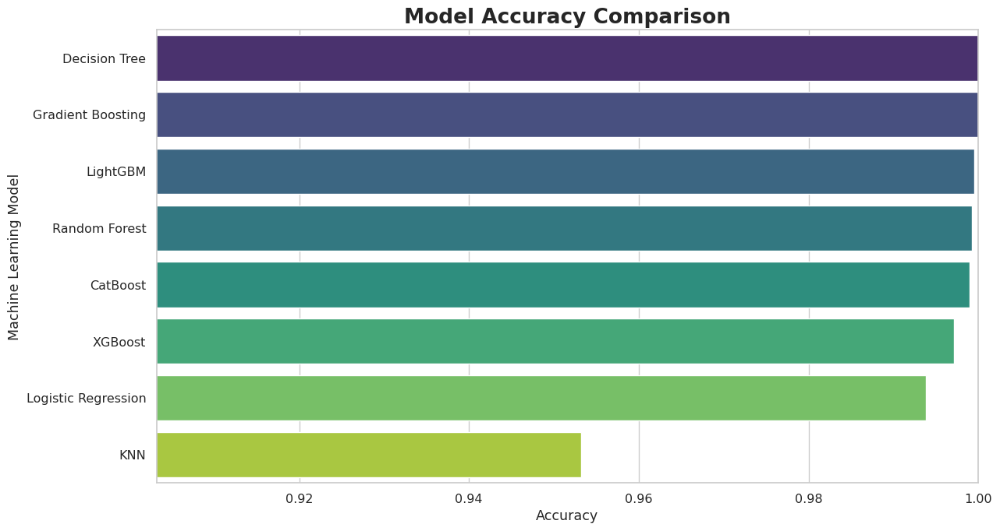

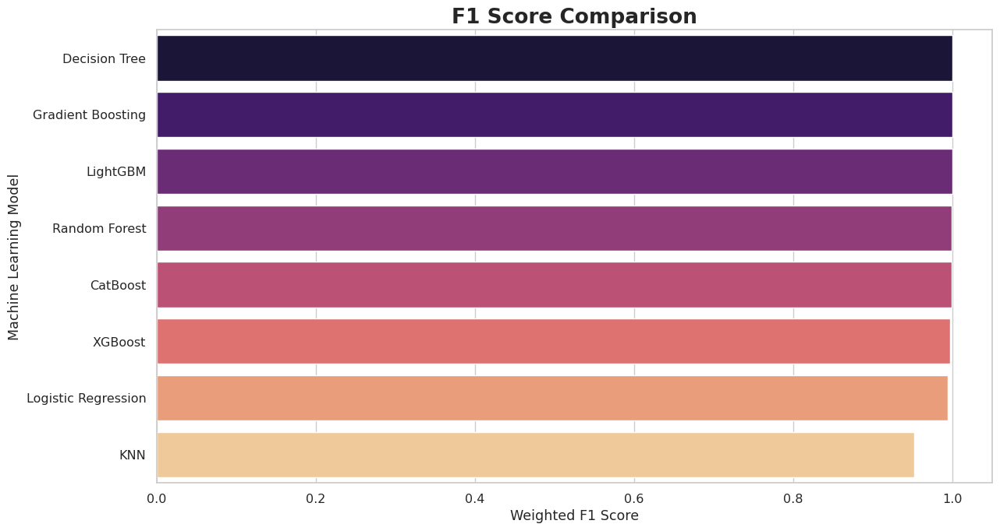

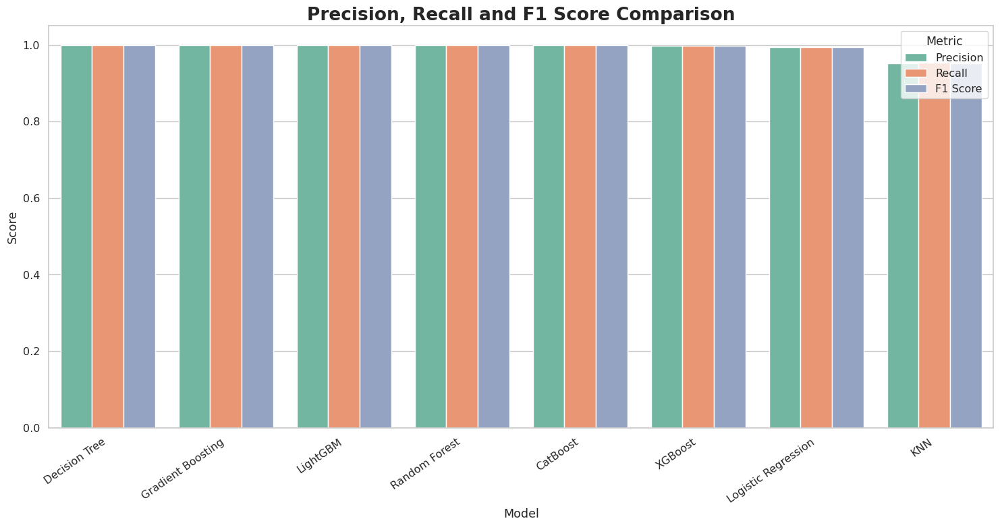


CLASSIFICATION REPORTS


Logistic Regression
              precision    recall  f1-score   support

        High       0.98      0.99      0.98      2970
         Low       1.00      1.00      1.00     20336
    Moderate       0.97      0.97      0.97      3195
      Severe       1.00      1.00      1.00     14299

    accuracy                           0.99     40800
   macro avg       0.99      0.99      0.99     40800
weighted avg       0.99      0.99      0.99     40800



KNN
              precision    recall  f1-score   support

        High       0.92      0.90      0.91      2970
         Low       0.95      0.98      0.97     20336
    Moderate       0.82      0.68      0.74      3195
      Severe       0.99      0.98      0.99     14299

    accuracy                           0.95     40800
   macro avg       0.92      0.89      0.90     40800
weighted avg       0.95      0.95      0.95     40800



Decision Tree
              precision    recall  f1-score   support

       

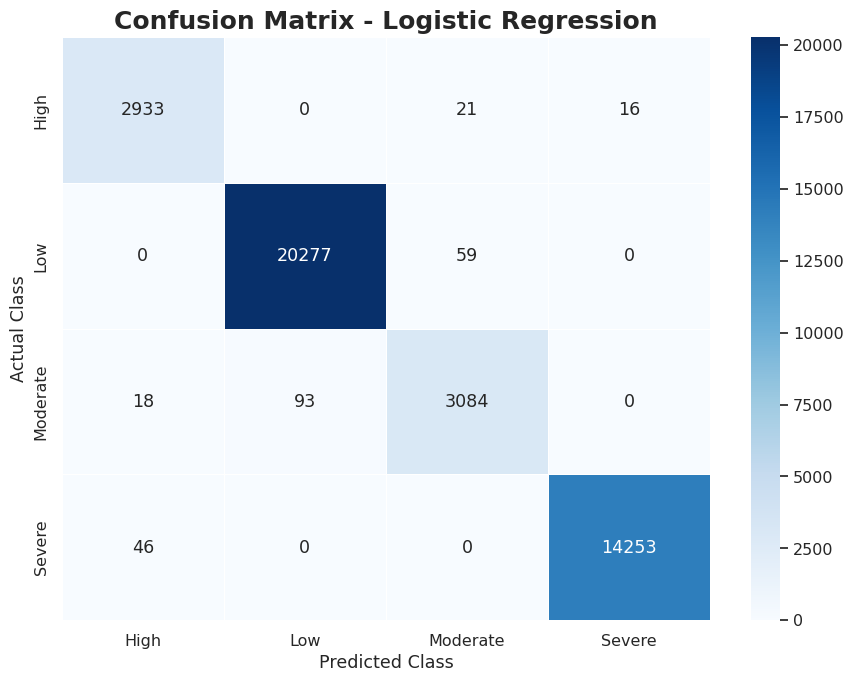

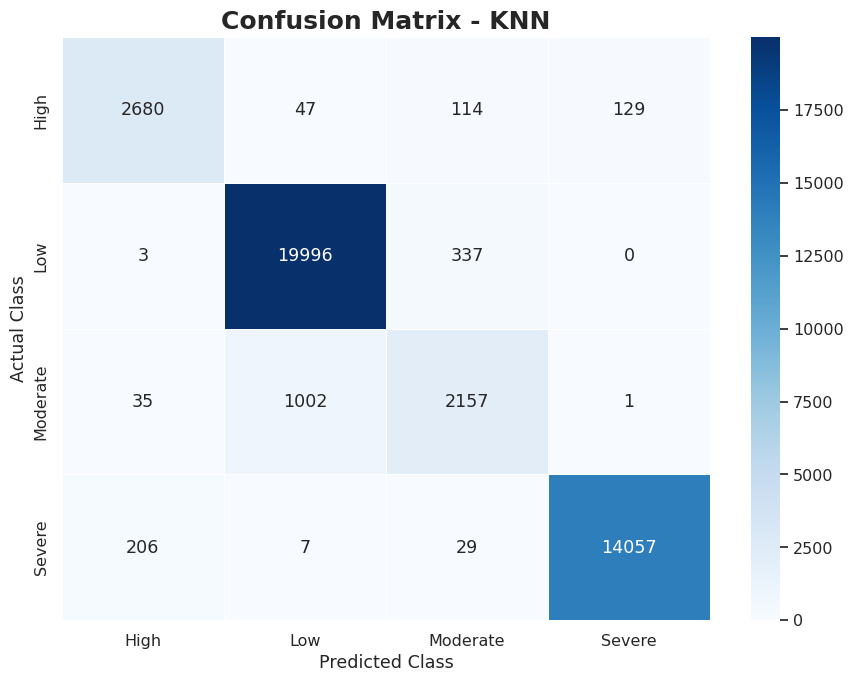

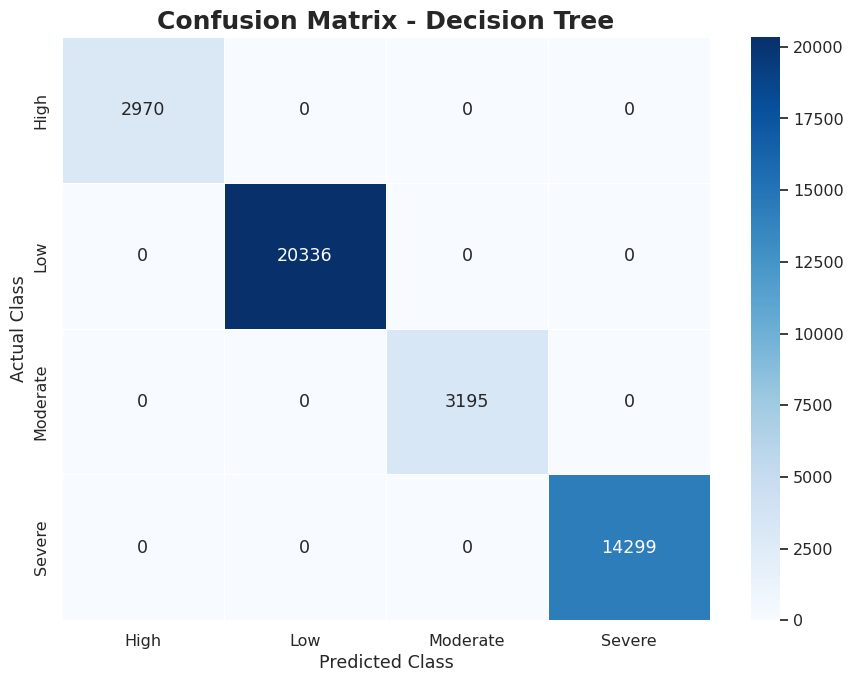

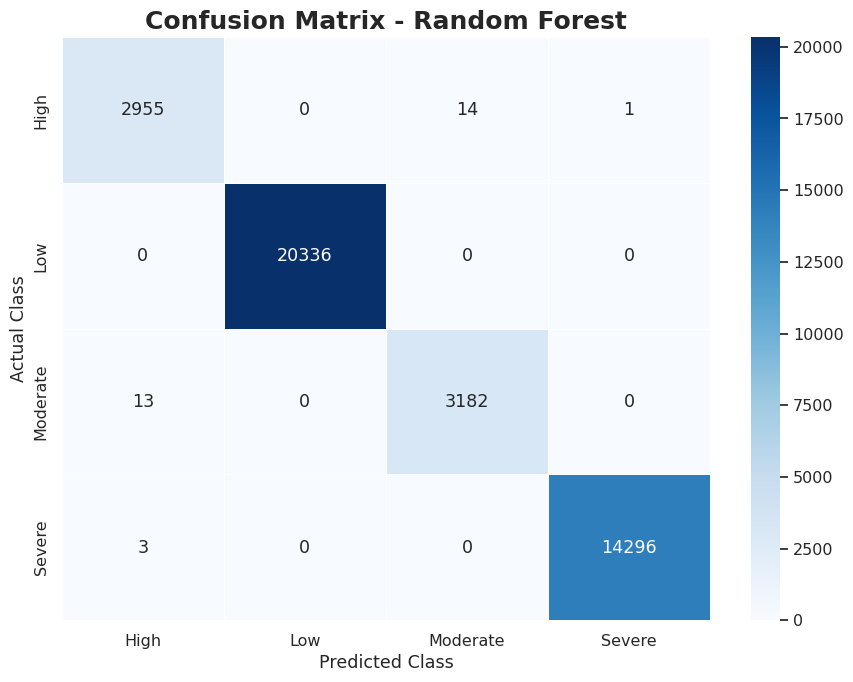

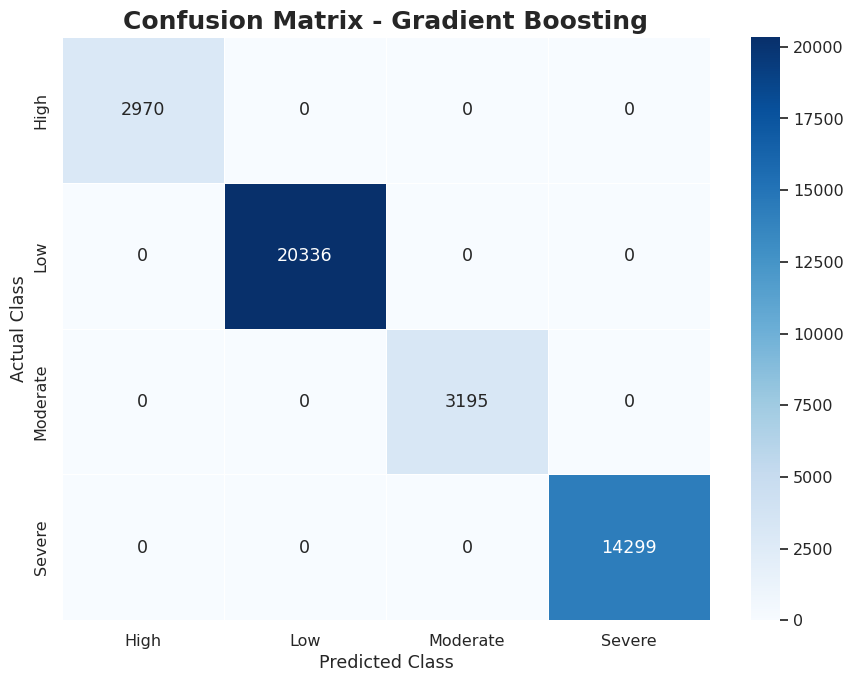

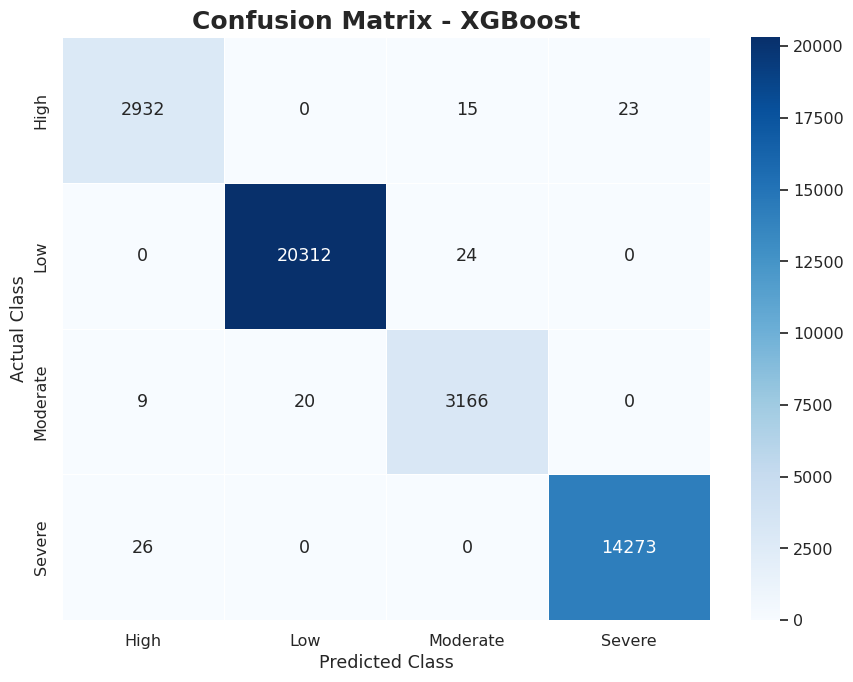

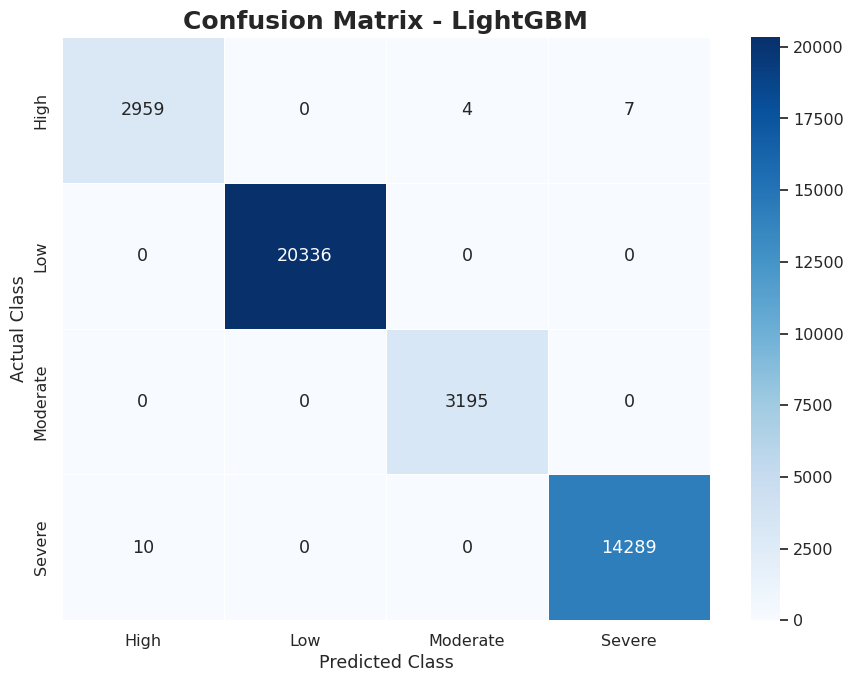

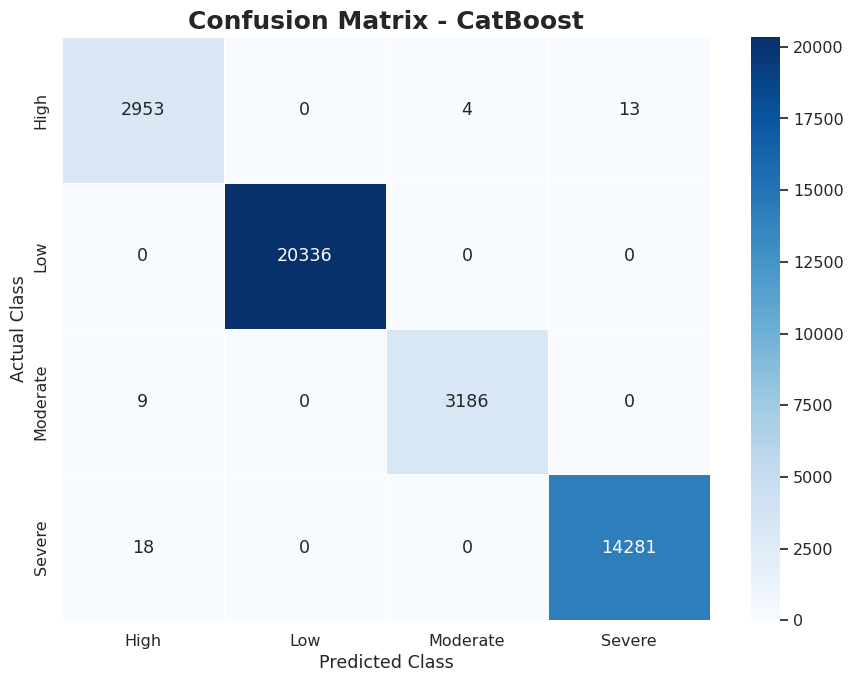


5-FOLD CROSS VALIDATION
Logistic Regression       Mean Accuracy = 0.9944 +/- 0.0002
KNN                       Mean Accuracy = 0.9522 +/- 0.0019
Decision Tree             Mean Accuracy = 1.0000 +/- 0.0000
Random Forest             Mean Accuracy = 0.9994 +/- 0.0001
Gradient Boosting         Mean Accuracy = 1.0000 +/- 0.0000
XGBoost                   Mean Accuracy = 0.9972 +/- 0.0002


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM                  Mean Accuracy = 0.9988 +/- 0.0008
CatBoost                  Mean Accuracy = 0.9992 +/- 0.0002

Cross Validation Summary:


,Model,CV Mean Accuracy,CV Std
2,Decision Tree,1.0000,0.0000
4,Gradient Boosting,1.0000,0.0000
3,Random Forest,0.9994,0.0001
7,CatBoost,0.9992,0.0002
6,LightGBM,0.9988,0.0008
5,XGBoost,0.9972,0.0002
0,Logistic Regression,0.9944,0.0002
1,KNN,0.9522,0.0019


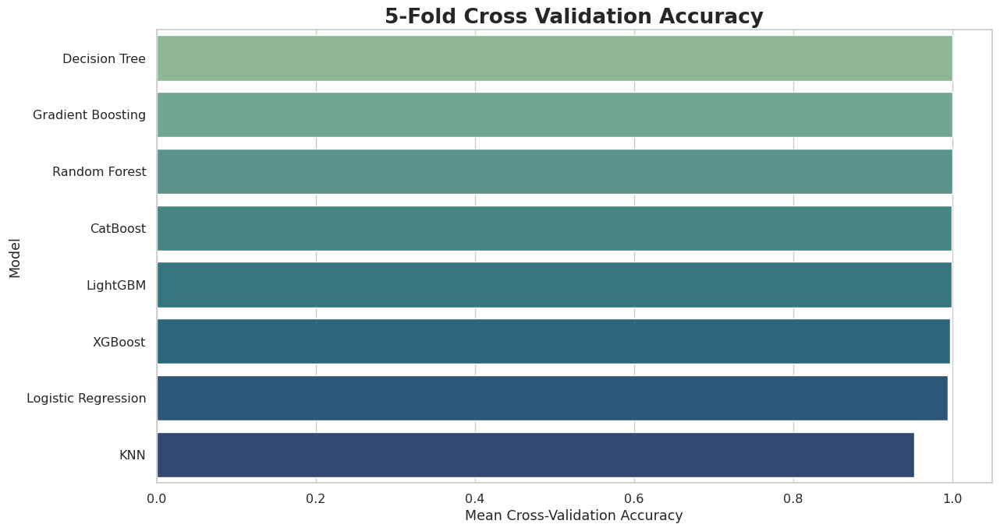


TOP 20 FEATURES - Decision Tree


,Feature,Importance
33,congestion_score,1.0
0,latitude,0.0
2,lanes,0.0
3,speed_limit,0.0
4,vehicle_count,0.0
1,longitude,0.0
6,heavy_vehicle_count,0.0
7,motorcycle_count,0.0
8,public_transport_count,0.0
9,traffic_density,0.0


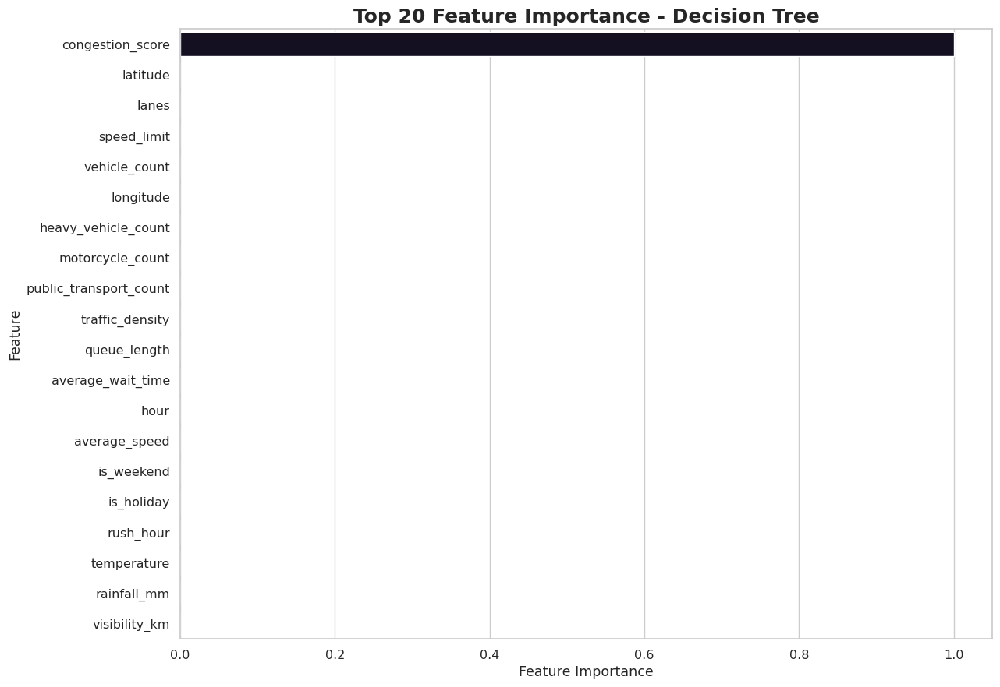


TOP 20 FEATURES - Random Forest


,Feature,Importance
33,congestion_score,0.176267
9,traffic_density,0.121582
32,traffic_flow_rate,0.074333
34,emission_estimate,0.068384
35,fuel_waste_estimate,0.067608
4,vehicle_count,0.057704
30,green_light_duration,0.055632
5,average_speed,0.047540
10,queue_length,0.036808
7,motorcycle_count,0.029485


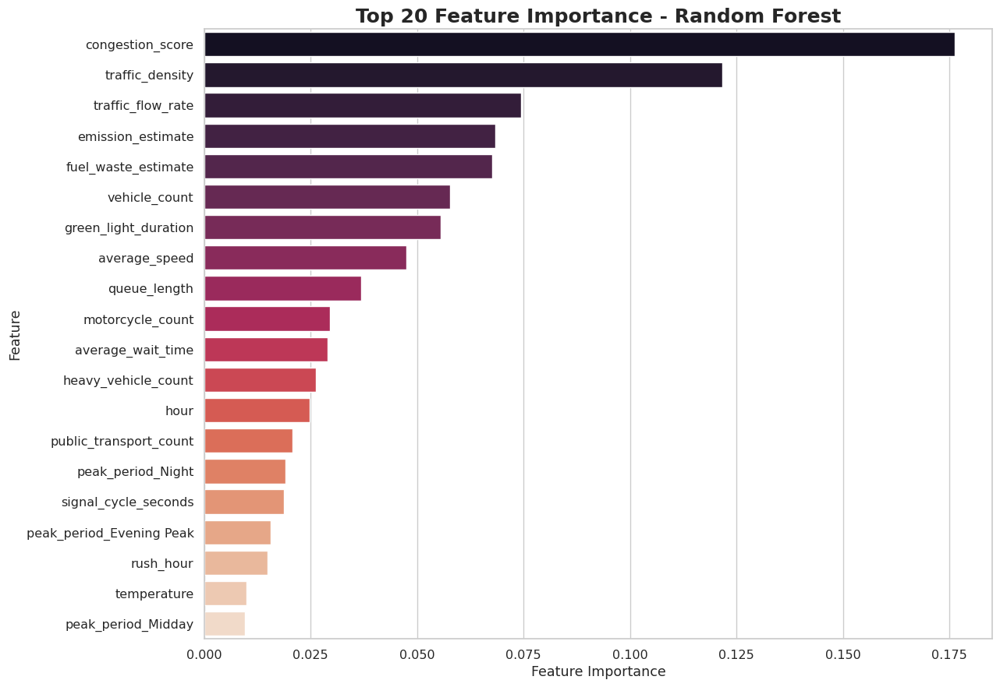


TOP 20 FEATURES - Gradient Boosting


,Feature,Importance
33,congestion_score,9.743029e-01
240,peak_period_Evening Peak,2.080449e-02
18,rainfall_mm,2.414870e-03
242,peak_period_Morning Peak,1.841465e-03
243,peak_period_Night,2.314672e-04
26,public_event,1.090521e-04
245,weather_condition_Clear,8.615237e-05
12,hour,8.527808e-05
9,traffic_density,6.568803e-05
248,weather_condition_Rain,4.929592e-05


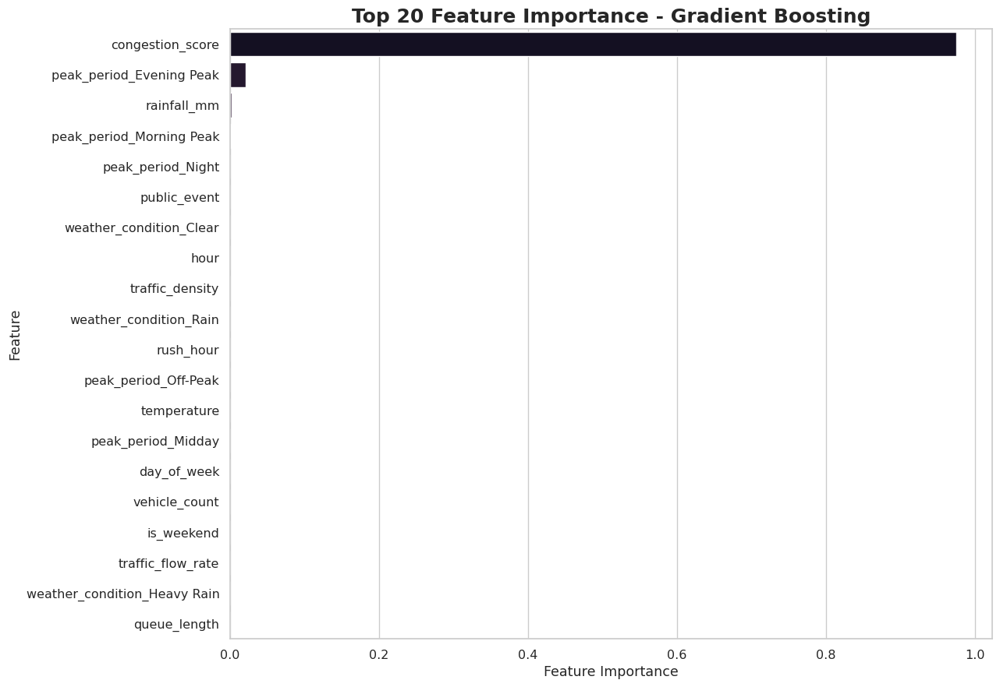


TOP 20 FEATURES - XGBoost


,Feature,Importance
240,peak_period_Evening Peak,0.555487
33,congestion_score,0.228596
9,traffic_density,0.096611
242,peak_period_Morning Peak,0.038858
34,emission_estimate,0.008111
247,weather_condition_Heavy Rain,0.006648
245,weather_condition_Clear,0.006315
18,rainfall_mm,0.005501
4,vehicle_count,0.004352
32,traffic_flow_rate,0.003934


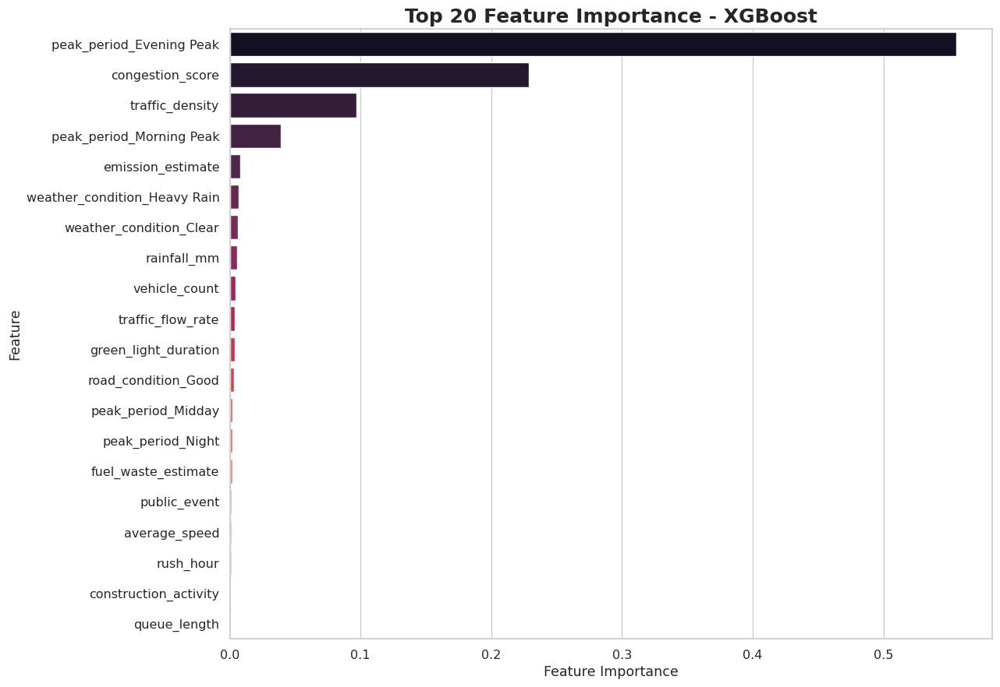


TOP 20 FEATURES - LightGBM


,Feature,Importance
33,congestion_score,6834
9,traffic_density,4742
5,average_speed,2906
10,queue_length,1248
8,public_transport_count,1230
18,rainfall_mm,1174
7,motorcycle_count,1163
6,heavy_vehicle_count,1161
17,temperature,1042
35,fuel_waste_estimate,982


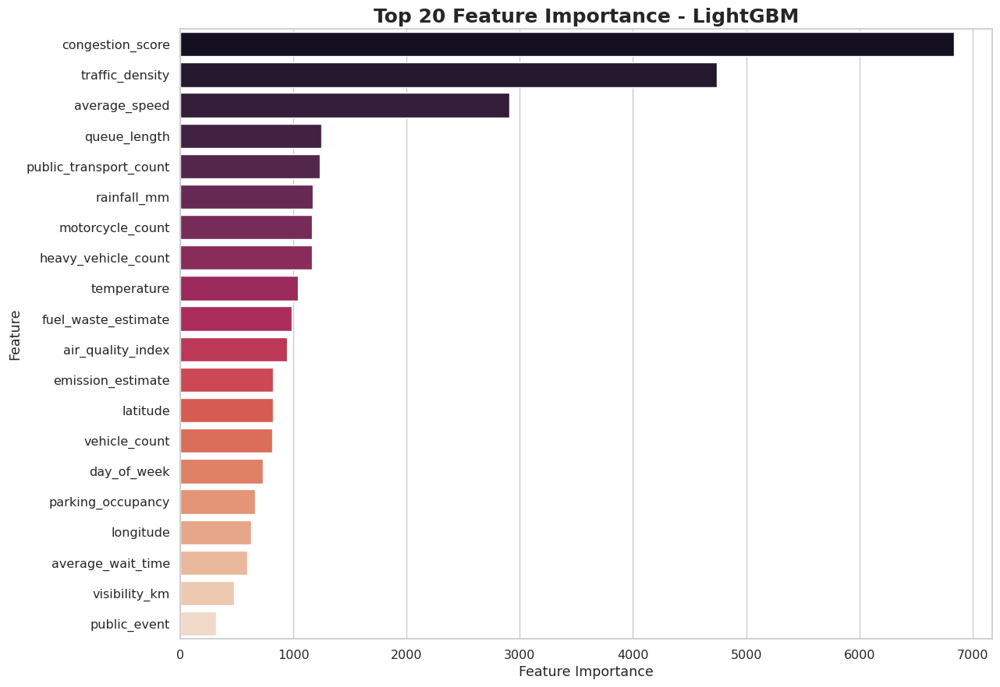

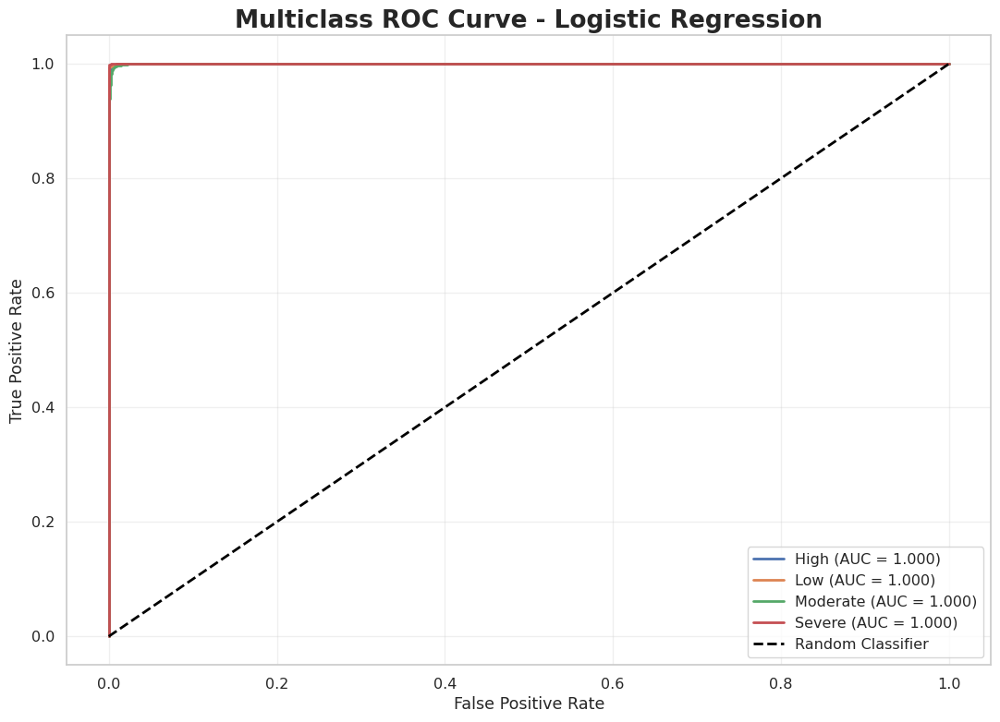

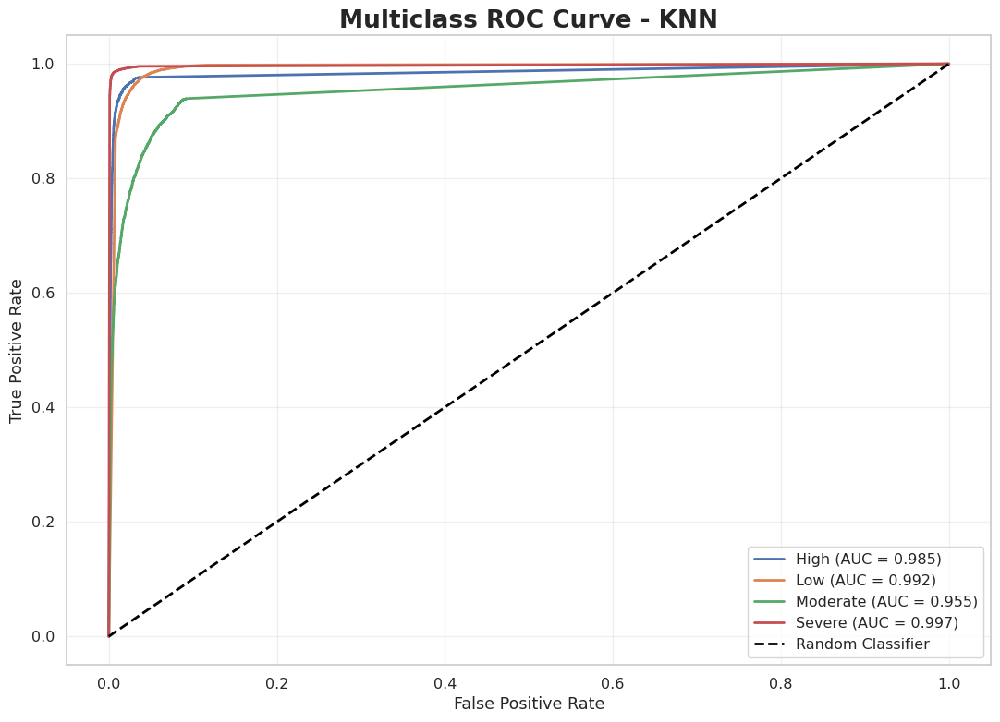

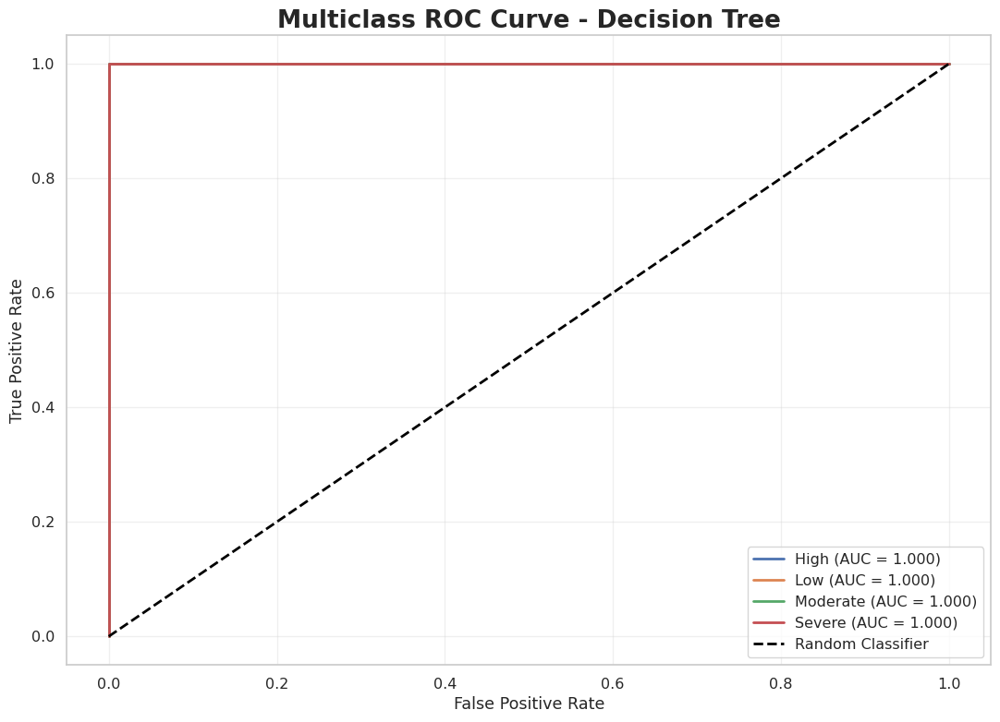

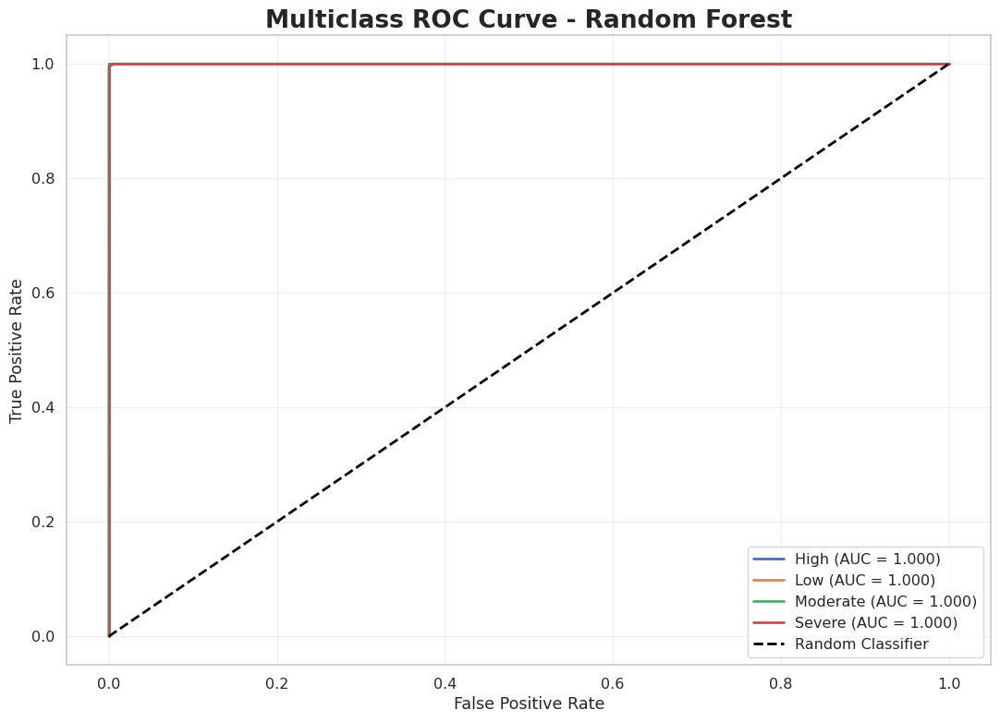

...

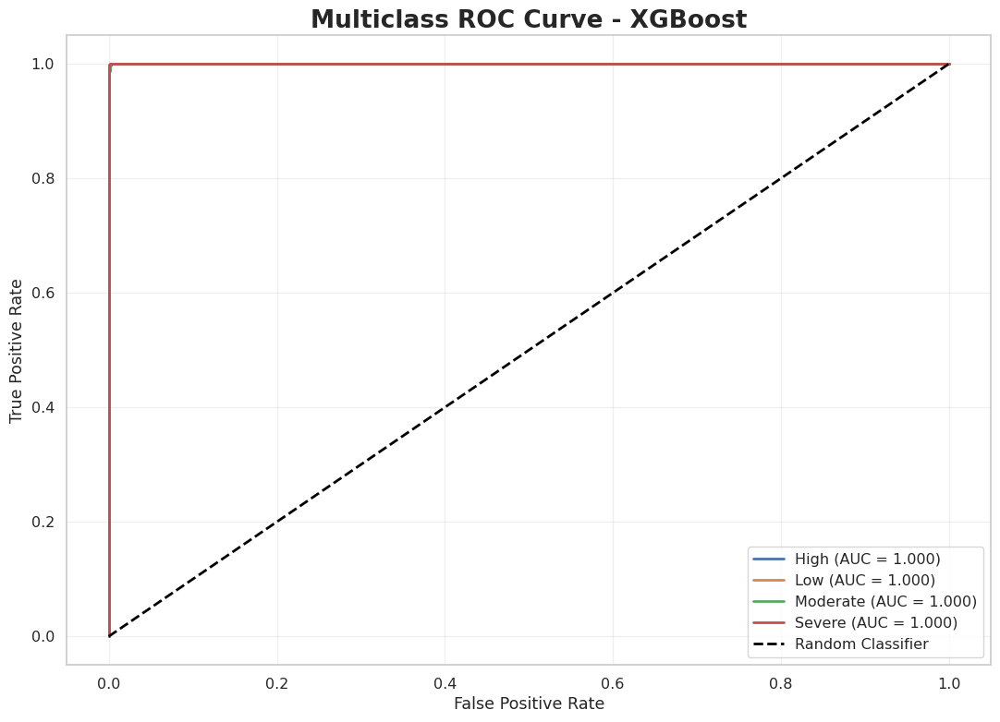

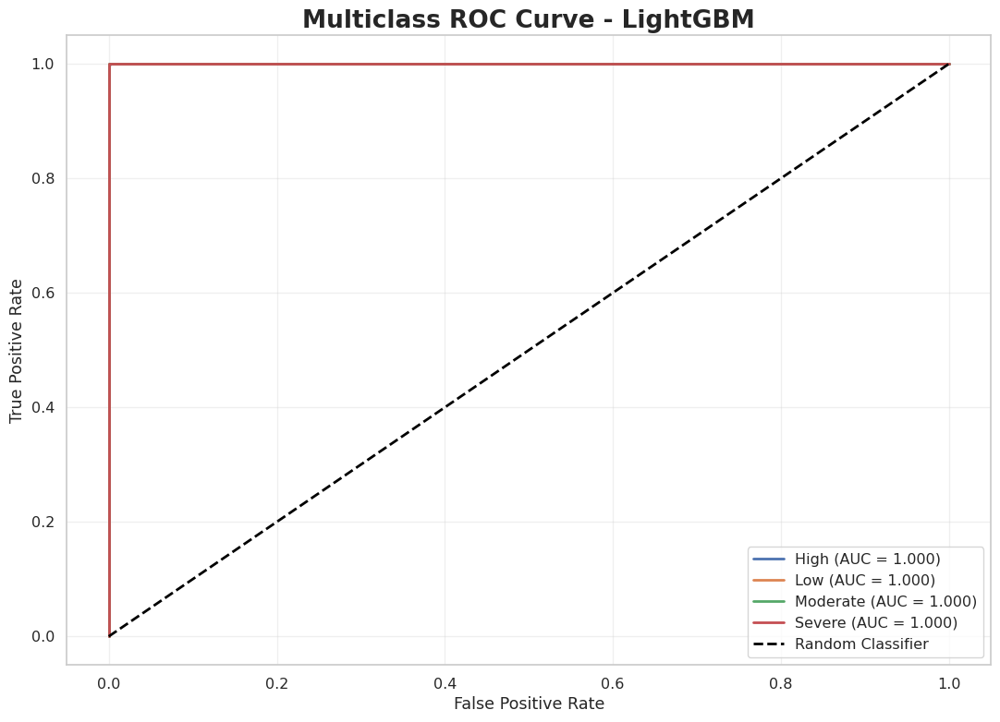

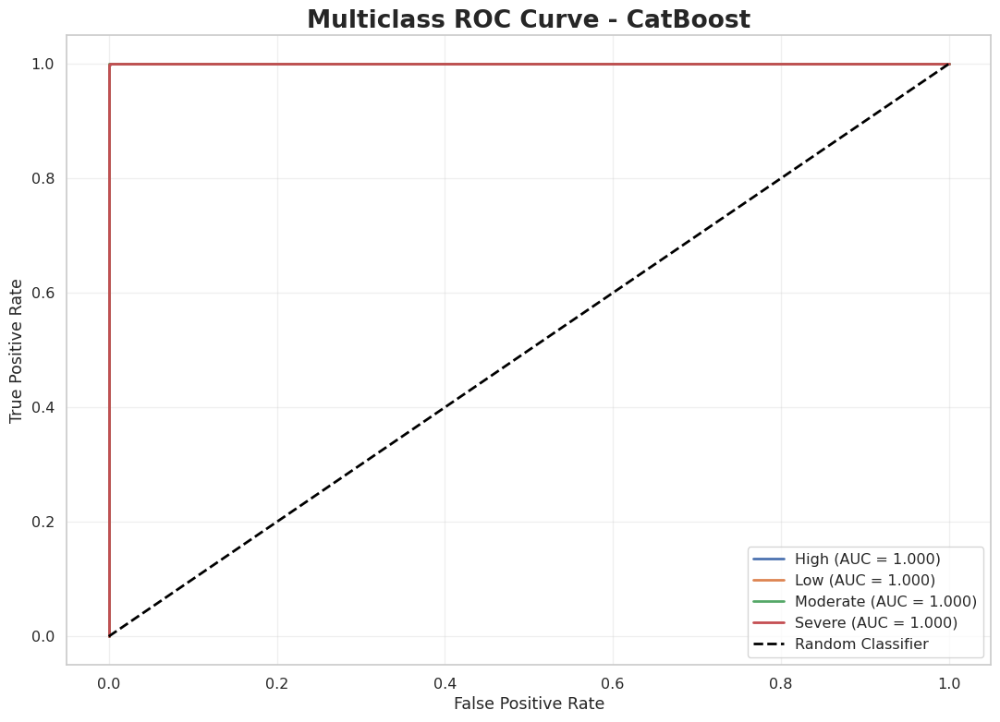

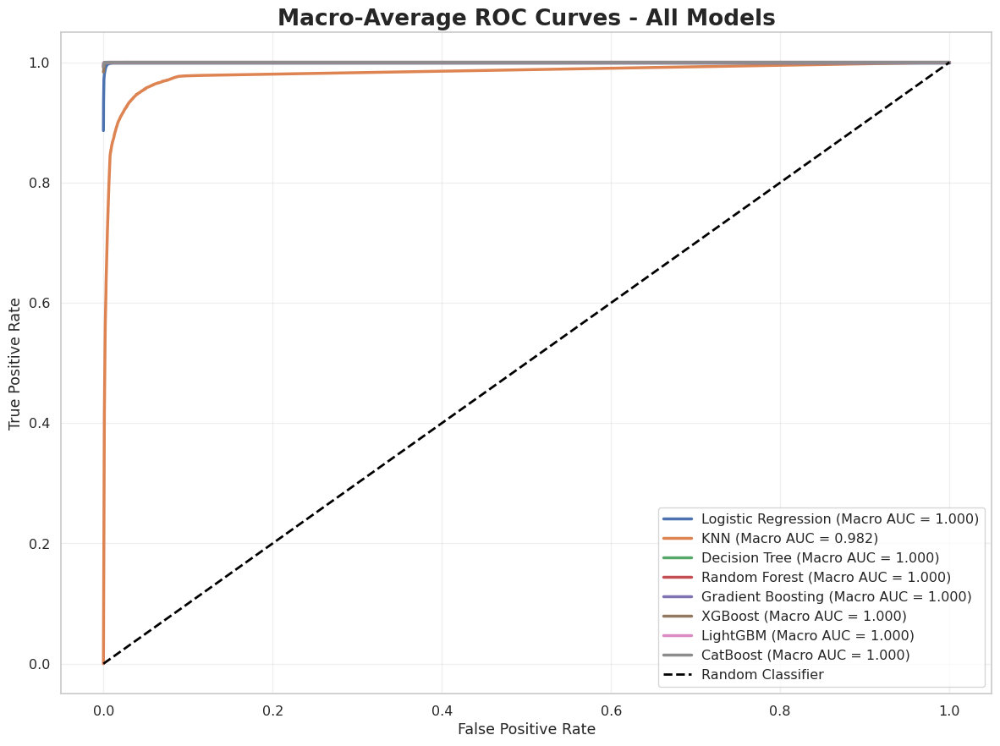

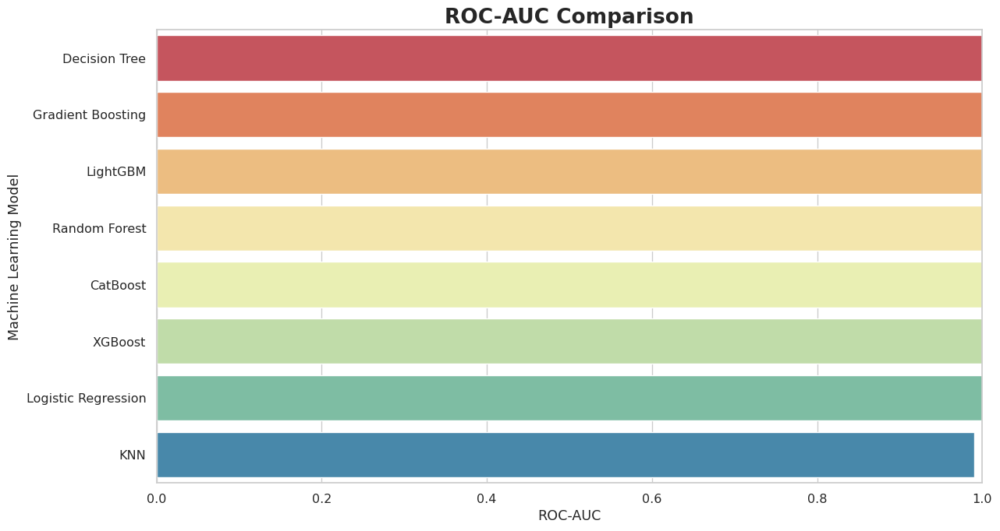



BEST MODEL
Best Model: Decision Tree
Accuracy : 1.0000
Precision: 1.0000
Recall   : 1.0000
F1 Score : 1.0000
ROC-AUC  : 1.0000


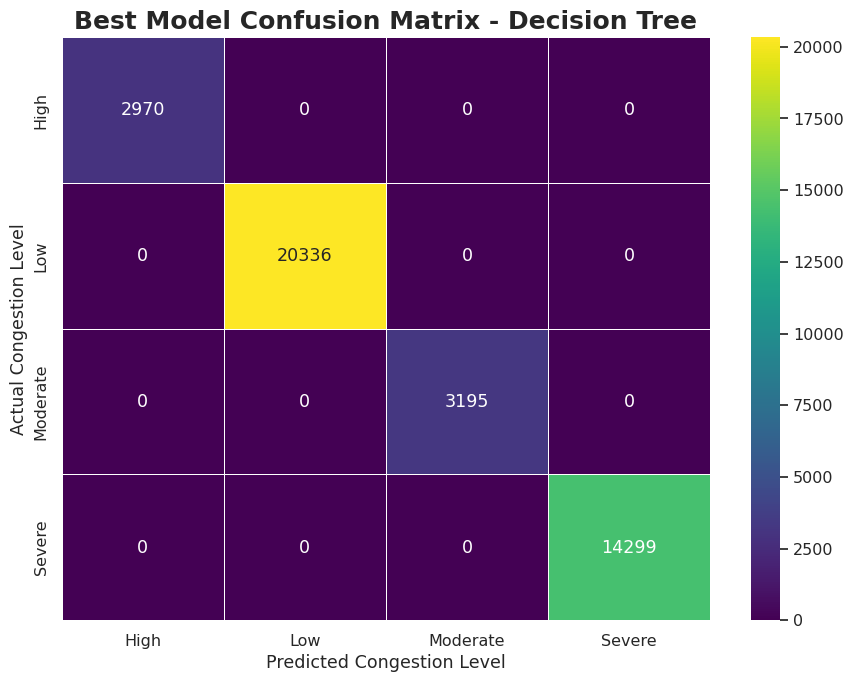



BEST MODEL CLASSIFICATION REPORT - Decision Tree
              precision    recall  f1-score   support

        High       1.00      1.00      1.00      2970
         Low       1.00      1.00      1.00     20336
    Moderate       1.00      1.00      1.00      3195
      Severe       1.00      1.00      1.00     14299

    accuracy                           1.00     40800
   macro avg       1.00      1.00      1.00     40800
weighted avg       1.00      1.00      1.00     40800



FINAL MODEL RANKING


,Rank,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,1,Decision Tree,1.0000,1.0000,1.0000,1.0000,1.0000
1,2,Gradient Boosting,1.0000,1.0000,1.0000,1.0000,1.0000
2,3,LightGBM,0.9995,0.9995,0.9995,0.9995,1.0000
3,4,Random Forest,0.9992,0.9992,0.9992,0.9992,1.0000
4,5,CatBoost,0.9989,0.9989,0.9989,0.9989,1.0000
5,6,XGBoost,0.9971,0.9971,0.9971,0.9971,1.0000
6,7,Logistic Regression,0.9938,0.9938,0.9938,0.9938,1.0000
7,8,KNN,0.9532,0.9515,0.9532,0.9516,0.9904




MACHINE LEARNING PIPELINE COMPLETED
Target Variable       : congestion_level
Number of Classes     : 4
Training Samples      : 163200
Testing Samples       : 40800
Number of Features    : 44
Models Trained        : 8
Best Model            : Decision Tree

Target Classes:
    0 = High
    1 = Low
    2 = Moderate
    3 = Severe

Completed:
    [OK] Train/Test Split
    [OK] Target Label Encoding
    [OK] Missing Value Handling
    [OK] One-Hot Encoding
    [OK] Feature Scaling
    [OK] Logistic Regression
    [OK] KNN
    [OK] Decision Tree
    [OK] Random Forest
    [OK] Gradient Boosting
    [OK] XGBoost (if installed)
    [OK] LightGBM (if installed)
    [OK] CatBoost (if installed)
    [OK] Accuracy
    [OK] Precision
    [OK] Recall
    [OK] F1 Score
    [OK] Classification Reports
    [OK] Confusion Matrices
    [OK] 5-Fold Cross Validation
    [OK] Feature Importance
    [OK] ROC Curves
    [OK] ROC-AUC
    [OK] Model Comparison


In [14]:
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

from sklearn.preprocessing import (
    LabelEncoder,
    OneHotEncoder,
    StandardScaler,
    label_binarize
)

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.impute import SimpleImputer

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier,
    GradientBoostingClassifier
)

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    roc_auc_score
)


# ================================================================
# 2. OPTIONAL ML LIBRARIES
# ================================================================

# XGBoost
try:
    from xgboost import XGBClassifier
    xgb_available = True
    print("XGBoost available.")
except ImportError:
    xgb_available = False
    print("XGBoost not installed - skipping XGBoost.")

# LightGBM
try:
    from lightgbm import LGBMClassifier
    lgb_available = True
    print("LightGBM available.")
except ImportError:
    lgb_available = False
    print("LightGBM not installed - skipping LightGBM.")

# CatBoost
try:
    from catboost import CatBoostClassifier
    cat_available = True
    print("CatBoost available.")
except ImportError:
    cat_available = False
    print("CatBoost not installed - skipping CatBoost.")


# ================================================================
# 3. CHECK DATAFRAME
# ================================================================

if "df" not in globals():
    raise ValueError(
        "DataFrame 'df' was not found. "
        "Load your dataset first using: df = pd.read_csv('your_file.csv')"
    )

print("=" * 80)
print("DATASET INFORMATION")
print("=" * 80)

print("Dataset Shape:", df.shape)

print("\nColumns:")
print(df.columns.tolist())

print("\nFirst 5 Rows:")
display(df.head())


# ================================================================
# 4. TARGET VARIABLE
# ================================================================

TARGET = "congestion_level"

if TARGET not in df.columns:
    raise ValueError(
        f"Target column '{TARGET}' was not found in the dataset."
    )

print("\nTarget Variable:", TARGET)

print("\nTarget Distribution:")
display(
    df[TARGET]
    .value_counts(dropna=False)
    .to_frame("Count")
)


# ================================================================
# 5. REMOVE MISSING TARGET ROWS
# ================================================================

df = df.dropna(subset=[TARGET]).copy()

print("\nShape after removing missing target values:")
print(df.shape)


# ================================================================
# 6. REMOVE DUPLICATES
# ================================================================

duplicate_count = df.duplicated().sum()

print("\nDuplicate Rows:", duplicate_count)

if duplicate_count > 0:
    df = df.drop_duplicates().reset_index(drop=True)

print("Shape after duplicate removal:", df.shape)


# ================================================================
# 7. DROP IDENTIFIER / TIMESTAMP COLUMNS
# ================================================================
#
# record_id:
#     Identifier, not a meaningful predictive feature.
#
# timestamp:
#     Raw timestamp can create high-cardinality/noisy information.
#
# If required, timestamp can instead be transformed into:
#     year, month, day, hour, weekday, etc.
#
# Your dataset already contains hour/day_of_week/is_weekend,
# so raw timestamp is removed.
# ================================================================

columns_to_drop = []

for col in ["record_id", "timestamp"]:
    if col in df.columns:
        columns_to_drop.append(col)

print("\nColumns removed:")
print(columns_to_drop)

df_ml = df.drop(
    columns=columns_to_drop,
    errors="ignore"
).copy()


# ================================================================
# 8. SEPARATE FEATURES AND TARGET
# ================================================================

X = df_ml.drop(columns=[TARGET])
y = df_ml[TARGET].copy()

print("\nFeature Shape:", X.shape)
print("Target Shape:", y.shape)


# ================================================================
# 9. LABEL ENCODE TARGET
# ================================================================
#
# IMPORTANT:
# LabelEncoder is applied ONLY to y.
#
# Feature categorical columns are handled separately using
# OneHotEncoder.
# ================================================================

label_encoder = LabelEncoder()

y_encoded = label_encoder.fit_transform(y)

class_names = label_encoder.classes_

print("\nOriginal Target Classes:")
print(class_names)

print("\nEncoded Target Classes:")

for encoded_value, original_value in enumerate(class_names):
    print(
        f"{original_value} -> {encoded_value}"
    )

number_of_classes = len(class_names)

print("\nNumber of Classes:", number_of_classes)


# ================================================================
# 10. TRAIN TEST SPLIT
# ================================================================
#
# 80% Training
# 20% Testing
#
# stratify=y ensures that class proportions remain similar.
# ================================================================

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y_encoded,
    test_size=0.20,
    random_state=42,
    stratify=y_encoded
)

print("\n" + "=" * 80)
print("TRAIN / TEST SPLIT")
print("=" * 80)

print("X_train:", X_train.shape)
print("X_test :", X_test.shape)
print("y_train:", y_train.shape)
print("y_test :", y_test.shape)


# ================================================================
# 11. IDENTIFY NUMERICAL AND CATEGORICAL FEATURES
# ================================================================

numeric_features = X_train.select_dtypes(
    include=["int64", "int32", "float64", "float32"]
).columns.tolist()

categorical_features = X_train.select_dtypes(
    include=["object", "category", "bool"]
).columns.tolist()

print("\nNumerical Features:")
print(numeric_features)

print("\nCategorical Features:")
print(categorical_features)


# ================================================================
# 12. PREPROCESSING PIPELINE
# ================================================================
#
# Numerical:
#     Median Imputation
#     StandardScaler
#
# Categorical:
#     Most Frequent Imputation
#     OneHotEncoder
#
# This preprocessing is fitted ONLY on training data through
# Pipeline / ColumnTransformer.
# ================================================================

numeric_pipeline = Pipeline(
    steps=[
        (
            "imputer",
            SimpleImputer(strategy="median")
        ),
        (
            "scaler",
            StandardScaler()
        )
    ]
)


categorical_pipeline = Pipeline(
    steps=[
        (
            "imputer",
            SimpleImputer(strategy="most_frequent")
        ),
        (
            "onehot",
            OneHotEncoder(
                handle_unknown="ignore",
                sparse_output=False
            )
        )
    ]
)


preprocessor = ColumnTransformer(
    transformers=[
        (
            "numeric",
            numeric_pipeline,
            numeric_features
        ),
        (
            "categorical",
            categorical_pipeline,
            categorical_features
        )
    ],
    remainder="drop"
)


# ================================================================
# 13. DEFINE MACHINE LEARNING MODELS
# ================================================================

models = {}


# ------------------------------------------------
# Logistic Regression
# ------------------------------------------------

models["Logistic Regression"] = LogisticRegression(
    max_iter=3000,
    random_state=42
)


# ------------------------------------------------
# KNN
# ------------------------------------------------

models["KNN"] = KNeighborsClassifier(
    n_neighbors=7,
    weights="distance"
)


# ------------------------------------------------
# Decision Tree
# ------------------------------------------------

models["Decision Tree"] = DecisionTreeClassifier(
    max_depth=12,
    min_samples_split=10,
    min_samples_leaf=4,
    random_state=42
)


# ------------------------------------------------
# Random Forest
# ------------------------------------------------

models["Random Forest"] = RandomForestClassifier(
    n_estimators=300,
    max_depth=18,
    min_samples_split=5,
    min_samples_leaf=2,
    random_state=42,
    n_jobs=-1,
    class_weight="balanced"
)


# ------------------------------------------------
# Gradient Boosting
# ------------------------------------------------

models["Gradient Boosting"] = GradientBoostingClassifier(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=5,
    random_state=42
)


# ------------------------------------------------
# XGBoost
# ------------------------------------------------

if xgb_available:

    if number_of_classes > 2:

        models["XGBoost"] = XGBClassifier(
            n_estimators=300,
            learning_rate=0.05,
            max_depth=6,
            subsample=0.8,
            colsample_bytree=0.8,
            objective="multi:softprob",
            num_class=number_of_classes,
            eval_metric="mlogloss",
            random_state=42,
            n_jobs=-1
        )

    else:

        models["XGBoost"] = XGBClassifier(
            n_estimators=300,
            learning_rate=0.05,
            max_depth=6,
            subsample=0.8,
            colsample_bytree=0.8,
            objective="binary:logistic",
            eval_metric="logloss",
            random_state=42,
            n_jobs=-1
        )


# ------------------------------------------------
# LightGBM
# ------------------------------------------------

if lgb_available:

    models["LightGBM"] = LGBMClassifier(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=8,
        num_leaves=31,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
        verbosity=-1
    )


# ------------------------------------------------
# CatBoost
# ------------------------------------------------

if cat_available:

    models["CatBoost"] = CatBoostClassifier(
        iterations=300,
        learning_rate=0.05,
        depth=7,
        loss_function="MultiClass"
        if number_of_classes > 2
        else "Logloss",
        verbose=False,
        random_seed=42
    )


print("\n" + "=" * 80)
print("MODELS TO TRAIN")
print("=" * 80)

for model_name in models:
    print("-", model_name)


# ================================================================
# 14. TRAIN ALL MODELS
# ================================================================

trained_models = {}

results = []

predictions = {}

probabilities = {}

print("\n" + "=" * 80)
print("MODEL TRAINING")
print("=" * 80)


for model_name, model in models.items():

    print("\n" + "-" * 70)
    print("Training:", model_name)
    print("-" * 70)

    # ------------------------------------------------------------
    # Create pipeline
    # ------------------------------------------------------------

    pipeline = Pipeline(
        steps=[
            (
                "preprocessor",
                preprocessor
            ),
            (
                "model",
                model
            )
        ]
    )

    # ------------------------------------------------------------
    # Train
    # ------------------------------------------------------------

    pipeline.fit(
        X_train,
        y_train
    )

    trained_models[model_name] = pipeline

    # ------------------------------------------------------------
    # Predictions
    # ------------------------------------------------------------

    y_pred = pipeline.predict(X_test)

    predictions[model_name] = y_pred

    # ------------------------------------------------------------
    # Probability predictions
    # ------------------------------------------------------------

    if hasattr(
        pipeline,
        "predict_proba"
    ):

        y_proba = pipeline.predict_proba(
            X_test
        )

        probabilities[model_name] = y_proba

    else:

        probabilities[model_name] = None

    # ------------------------------------------------------------
    # Metrics
    # ------------------------------------------------------------

    accuracy = accuracy_score(
        y_test,
        y_pred
    )

    precision = precision_score(
        y_test,
        y_pred,
        average="weighted",
        zero_division=0
    )

    recall = recall_score(
        y_test,
        y_pred,
        average="weighted",
        zero_division=0
    )

    f1 = f1_score(
        y_test,
        y_pred,
        average="weighted",
        zero_division=0
    )

    # ------------------------------------------------------------
    # ROC-AUC
    # ------------------------------------------------------------

    roc_auc_value = np.nan

    if probabilities[model_name] is not None:

        try:

            if number_of_classes == 2:

                roc_auc_value = roc_auc_score(
                    y_test,
                    probabilities[model_name][:, 1]
                )

            else:

                roc_auc_value = roc_auc_score(
                    y_test,
                    probabilities[model_name],
                    multi_class="ovr",
                    average="weighted"
                )

        except Exception as e:

            print(
                "ROC-AUC calculation skipped:",
                e
            )

    results.append(
        {
            "Model": model_name,
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1,
            "ROC-AUC": roc_auc_value
        }
    )

    print(
        f"Accuracy : {accuracy:.4f}"
    )

    print(
        f"Precision: {precision:.4f}"
    )

    print(
        f"Recall   : {recall:.4f}"
    )

    print(
        f"F1 Score : {f1:.4f}"
    )

    if not np.isnan(roc_auc_value):

        print(
            f"ROC-AUC  : {roc_auc_value:.4f}"
        )


# ================================================================
# 15. MODEL COMPARISON TABLE
# ================================================================

results_df = pd.DataFrame(results)

results_df = results_df.sort_values(
    by="F1 Score",
    ascending=False
).reset_index(drop=True)

print("\n" + "=" * 80)
print("MODEL PERFORMANCE COMPARISON")
print("=" * 80)

display(
    results_df.style
    .format(
        {
            "Accuracy": "{:.4f}",
            "Precision": "{:.4f}",
            "Recall": "{:.4f}",
            "F1 Score": "{:.4f}",
            "ROC-AUC": "{:.4f}"
        }
    )
)


# ================================================================
# 16. ACCURACY COMPARISON
# ================================================================

plt.figure(figsize=(13, 7))

sns.barplot(
    data=results_df,
    x="Accuracy",
    y="Model",
    palette="viridis"
)

plt.title(
    "Model Accuracy Comparison",
    fontsize=19,
    fontweight="bold"
)

plt.xlabel("Accuracy")
plt.ylabel("Machine Learning Model")

plt.xlim(
    max(0, results_df["Accuracy"].min() - 0.05),
    min(1, results_df["Accuracy"].max() + 0.05)
)

plt.tight_layout()
plt.show()


# ================================================================
# 17. F1 SCORE COMPARISON
# ================================================================

plt.figure(figsize=(13, 7))

sns.barplot(
    data=results_df,
    x="F1 Score",
    y="Model",
    palette="magma"
)

plt.title(
    "F1 Score Comparison",
    fontsize=19,
    fontweight="bold"
)

plt.xlabel("Weighted F1 Score")
plt.ylabel("Machine Learning Model")

plt.tight_layout()
plt.show()


# ================================================================
# 18. PRECISION / RECALL COMPARISON
# ================================================================

metrics_long = results_df.melt(
    id_vars="Model",
    value_vars=[
        "Precision",
        "Recall",
        "F1 Score"
    ],
    var_name="Metric",
    value_name="Score"
)

plt.figure(figsize=(15, 8))

sns.barplot(
    data=metrics_long,
    x="Model",
    y="Score",
    hue="Metric",
    palette="Set2"
)

plt.title(
    "Precision, Recall and F1 Score Comparison",
    fontsize=19,
    fontweight="bold"
)

plt.xlabel("Model")
plt.ylabel("Score")

plt.xticks(
    rotation=35,
    ha="right"
)

plt.ylim(0, 1.05)

plt.tight_layout()
plt.show()


# ================================================================
# 19. CLASSIFICATION REPORTS
# ================================================================

print("\n" + "=" * 80)
print("CLASSIFICATION REPORTS")
print("=" * 80)


for model_name in trained_models:

    print("\n")
    print("=" * 70)
    print(model_name)
    print("=" * 70)

    print(
        classification_report(
            y_test,
            predictions[model_name],
            target_names=[
                str(x)
                for x in class_names
            ],
            zero_division=0
        )
    )


# ================================================================
# 20. CONFUSION MATRICES
# ================================================================

for model_name in trained_models:

    cm = confusion_matrix(
        y_test,
        predictions[model_name]
    )

    plt.figure(figsize=(9, 7))

    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names,
        linewidths=0.5
    )

    plt.title(
        f"Confusion Matrix - {model_name}",
        fontsize=18,
        fontweight="bold"
    )

    plt.xlabel("Predicted Class")
    plt.ylabel("Actual Class")

    plt.tight_layout()
    plt.show()


# ================================================================
# 21. CROSS VALIDATION
# ================================================================
#
# 5-fold Stratified Cross Validation
# ================================================================

print("\n" + "=" * 80)
print("5-FOLD CROSS VALIDATION")
print("=" * 80)

cv_results = []

cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)


for model_name, model in models.items():

    pipeline = Pipeline(
        steps=[
            (
                "preprocessor",
                preprocessor
            ),
            (
                "model",
                model
            )
        ]
    )

    scores = cross_val_score(
        pipeline,
        X,
        y_encoded,
        cv=cv,
        scoring="accuracy",
        n_jobs=-1
    )

    cv_results.append(
        {
            "Model": model_name,
            "CV Mean Accuracy": scores.mean(),
            "CV Std": scores.std()
        }
    )

    print(
        f"{model_name:25s} "
        f"Mean Accuracy = {scores.mean():.4f} "
        f"+/- {scores.std():.4f}"
    )


cv_results_df = pd.DataFrame(
    cv_results
).sort_values(
    "CV Mean Accuracy",
    ascending=False
)

print("\nCross Validation Summary:")
display(
    cv_results_df.style.format(
        {
            "CV Mean Accuracy": "{:.4f}",
            "CV Std": "{:.4f}"
        }
    )
)


# ================================================================
# 22. CROSS VALIDATION VISUALIZATION
# ================================================================

plt.figure(figsize=(13, 7))

sns.barplot(
    data=cv_results_df,
    x="CV Mean Accuracy",
    y="Model",
    palette="crest"
)

plt.title(
    "5-Fold Cross Validation Accuracy",
    fontsize=19,
    fontweight="bold"
)

plt.xlabel("Mean Cross-Validation Accuracy")
plt.ylabel("Model")

plt.tight_layout()
plt.show()


# ================================================================
# 23. FEATURE IMPORTANCE
# ================================================================
#
# Feature importance is extracted from:
#     Random Forest
#     Decision Tree
#     Gradient Boosting
#     XGBoost
#     LightGBM
#
# Because categorical variables are one-hot encoded, we first
# recover transformed feature names.
# ================================================================

def get_feature_names_from_pipeline(pipeline):

    fitted_preprocessor = pipeline.named_steps[
        "preprocessor"
    ]

    try:

        feature_names = (
            fitted_preprocessor
            .get_feature_names_out()
        )

        feature_names = [
            name.replace(
                "numeric__",
                ""
            ).replace(
                "categorical__",
                ""
            )
            for name in feature_names
        ]

        return feature_names

    except Exception:

        return None


importance_models = [
    "Decision Tree",
    "Random Forest",
    "Gradient Boosting",
    "XGBoost",
    "LightGBM"
]


for model_name in importance_models:

    if model_name not in trained_models:
        continue

    pipeline = trained_models[
        model_name
    ]

    estimator = pipeline.named_steps[
        "model"
    ]

    if not hasattr(
        estimator,
        "feature_importances_"
    ):
        continue

    feature_names = get_feature_names_from_pipeline(
        pipeline
    )

    importances = estimator.feature_importances_

    if feature_names is not None:

        importance_df = pd.DataFrame(
            {
                "Feature": feature_names,
                "Importance": importances
            }
        )

        importance_df = (
            importance_df
            .sort_values(
                "Importance",
                ascending=False
            )
            .head(20)
        )

        print("\n" + "=" * 80)
        print(
            f"TOP 20 FEATURES - {model_name}"
        )
        print("=" * 80)

        display(importance_df)

        plt.figure(figsize=(13, 9))

        sns.barplot(
            data=importance_df,
            x="Importance",
            y="Feature",
            palette="rocket"
        )

        plt.title(
            f"Top 20 Feature Importance - {model_name}",
            fontsize=18,
            fontweight="bold"
        )

        plt.xlabel("Feature Importance")
        plt.ylabel("Feature")

        plt.tight_layout()
        plt.show()


# ================================================================
# 24. ROC CURVE - BINARY CLASSIFICATION
# ================================================================

if number_of_classes == 2:

    plt.figure(figsize=(11, 8))

    for model_name, y_proba in probabilities.items():

        if y_proba is None:
            continue

        fpr, tpr, _ = roc_curve(
            y_test,
            y_proba[:, 1]
        )

        roc_auc = auc(
            fpr,
            tpr
        )

        plt.plot(
            fpr,
            tpr,
            linewidth=2.5,
            label=f"{model_name} (AUC = {roc_auc:.3f})"
        )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        color="black",
        linewidth=2,
        label="Random Classifier"
    )

    plt.title(
        "ROC Curves - All Machine Learning Models",
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel(
        "False Positive Rate (1 - Specificity)"
    )

    plt.ylabel(
        "True Positive Rate (Sensitivity)"
    )

    plt.legend(
        loc="lower right"
    )

    plt.grid(
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()


# ================================================================
# 25. MULTICLASS ROC CURVES
# ================================================================
#
# For multiple congestion levels:
#
# One-vs-Rest (OvR) is used.
#
# Example:
#     Low vs all other classes
#     Medium vs all other classes
#     High vs all other classes
#
# Every model gets its own ROC curve.
# ================================================================

if number_of_classes > 2:

    y_test_binarized = label_binarize(
        y_test,
        classes=np.arange(number_of_classes)
    )

    for model_name, y_proba in probabilities.items():

        if y_proba is None:
            continue

        plt.figure(figsize=(11, 8))

        for class_index in range(
            number_of_classes
        ):

            fpr, tpr, _ = roc_curve(
                y_test_binarized[:, class_index],
                y_proba[:, class_index]
            )

            roc_auc = auc(
                fpr,
                tpr
            )

            plt.plot(
                fpr,
                tpr,
                linewidth=2,
                label=(
                    f"{class_names[class_index]} "
                    f"(AUC = {roc_auc:.3f})"
                )
            )

        plt.plot(
            [0, 1],
            [0, 1],
            linestyle="--",
            color="black",
            linewidth=2,
            label="Random Classifier"
        )

        plt.title(
            f"Multiclass ROC Curve - {model_name}",
            fontsize=19,
            fontweight="bold"
        )

        plt.xlabel(
            "False Positive Rate"
        )

        plt.ylabel(
            "True Positive Rate"
        )

        plt.legend(
            loc="lower right"
        )

        plt.grid(
            alpha=0.3
        )

        plt.tight_layout()
        plt.show()


# ================================================================
# 26. MACRO-AVERAGE ROC CURVES
# ================================================================
#
# Macro ROC combines the performance across all classes.
# This is particularly useful for multiclass congestion levels.
# ================================================================

if number_of_classes > 2:

    y_test_binarized = label_binarize(
        y_test,
        classes=np.arange(number_of_classes)
    )

    plt.figure(figsize=(12, 9))

    for model_name, y_proba in probabilities.items():

        if y_proba is None:
            continue

        all_fpr = np.unique(
            np.concatenate(
                [
                    roc_curve(
                        y_test_binarized[:, class_index],
                        y_proba[:, class_index]
                    )[0]
                    for class_index in range(
                        number_of_classes
                    )
                ]
            )
        )

        mean_tpr = np.zeros_like(
            all_fpr
        )

        for class_index in range(
            number_of_classes
        ):

            fpr, tpr, _ = roc_curve(
                y_test_binarized[:, class_index],
                y_proba[:, class_index]
            )

            mean_tpr += np.interp(
                all_fpr,
                fpr,
                tpr
            )

        mean_tpr /= number_of_classes

        macro_auc = auc(
            all_fpr,
            mean_tpr
        )

        plt.plot(
            all_fpr,
            mean_tpr,
            linewidth=2.5,
            label=(
                f"{model_name} "
                f"(Macro AUC = {macro_auc:.3f})"
            )
        )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        color="black",
        linewidth=2,
        label="Random Classifier"
    )

    plt.title(
        "Macro-Average ROC Curves - All Models",
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel(
        "False Positive Rate"
    )

    plt.ylabel(
        "True Positive Rate"
    )

    plt.legend(
        loc="lower right"
    )

    plt.grid(
        alpha=0.3
    )

    plt.tight_layout()
    plt.show()


# ================================================================
# 27. ROC-AUC COMPARISON
# ================================================================

roc_results = results_df[
    [
        "Model",
        "ROC-AUC"
    ]
].dropna().copy()

roc_results = roc_results.sort_values(
    "ROC-AUC",
    ascending=False
)

if len(roc_results) > 0:

    plt.figure(figsize=(13, 7))

    sns.barplot(
        data=roc_results,
        x="ROC-AUC",
        y="Model",
        palette="Spectral"
    )

    plt.title(
        "ROC-AUC Comparison",
        fontsize=19,
        fontweight="bold"
    )

    plt.xlabel(
        "ROC-AUC"
    )

    plt.ylabel(
        "Machine Learning Model"
    )

    plt.xlim(0, 1)

    plt.tight_layout()
    plt.show()


# ================================================================
# 28. BEST MODEL
# ================================================================

best_model_name = results_df.iloc[0]["Model"]

best_model = trained_models[
    best_model_name
]

best_row = results_df[
    results_df["Model"] == best_model_name
].iloc[0]

print("\n")
print("=" * 80)
print("BEST MODEL")
print("=" * 80)

print(
    "Best Model:",
    best_model_name
)

print(
    f"Accuracy : {best_row['Accuracy']:.4f}"
)

print(
    f"Precision: {best_row['Precision']:.4f}"
)

print(
    f"Recall   : {best_row['Recall']:.4f}"
)

print(
    f"F1 Score : {best_row['F1 Score']:.4f}"
)

if not pd.isna(best_row["ROC-AUC"]):

    print(
        f"ROC-AUC  : {best_row['ROC-AUC']:.4f}"
    )


# ================================================================
# 29. BEST MODEL CONFUSION MATRIX
# ================================================================

best_predictions = predictions[
    best_model_name
]

best_cm = confusion_matrix(
    y_test,
    best_predictions
)

plt.figure(figsize=(9, 7))

sns.heatmap(
    best_cm,
    annot=True,
    fmt="d",
    cmap="viridis",
    xticklabels=class_names,
    yticklabels=class_names,
    linewidths=0.5
)

plt.title(
    f"Best Model Confusion Matrix - {best_model_name}",
    fontsize=18,
    fontweight="bold"
)

plt.xlabel(
    "Predicted Congestion Level"
)

plt.ylabel(
    "Actual Congestion Level"
)

plt.tight_layout()
plt.show()


# ================================================================
# 30. BEST MODEL CLASSIFICATION REPORT
# ================================================================

print("\n")
print("=" * 80)
print(
    f"BEST MODEL CLASSIFICATION REPORT - {best_model_name}"
)
print("=" * 80)

print(
    classification_report(
        y_test,
        best_predictions,
        target_names=[
            str(x)
            for x in class_names
        ],
        zero_division=0
    )
)


# ================================================================
# 31. FINAL MODEL COMPARISON
# ================================================================

final_comparison = results_df.copy()

final_comparison[
    "Rank"
] = range(
    1,
    len(final_comparison) + 1
)

final_comparison = final_comparison[
    [
        "Rank",
        "Model",
        "Accuracy",
        "Precision",
        "Recall",
        "F1 Score",
        "ROC-AUC"
    ]
]

print("\n")
print("=" * 80)
print("FINAL MODEL RANKING")
print("=" * 80)

display(
    final_comparison.style
    .format(
        {
            "Accuracy": "{:.4f}",
            "Precision": "{:.4f}",
            "Recall": "{:.4f}",
            "F1 Score": "{:.4f}",
            "ROC-AUC": "{:.4f}"
        }
    )
)


# ================================================================
# 32. FINAL SUMMARY
# ================================================================

print("\n")
print("=" * 80)
print("MACHINE LEARNING PIPELINE COMPLETED")
print("=" * 80)

print("Target Variable       :", TARGET)
print("Number of Classes     :", number_of_classes)
print("Training Samples      :", len(X_train))
print("Testing Samples       :", len(X_test))
print("Number of Features    :", X.shape[1])
print("Models Trained        :", len(trained_models))
print("Best Model            :", best_model_name)

print("\nTarget Classes:")

for i, class_name in enumerate(class_names):

    print(
        f"    {i} = {class_name}"
    )

print("\nCompleted:")
print("    [OK] Train/Test Split")
print("    [OK] Target Label Encoding")
print("    [OK] Missing Value Handling")
print("    [OK] One-Hot Encoding")
print("    [OK] Feature Scaling")
print("    [OK] Logistic Regression")
print("    [OK] KNN")
print("    [OK] Decision Tree")
print("    [OK] Random Forest")
print("    [OK] Gradient Boosting")
print("    [OK] XGBoost (if installed)")
print("    [OK] LightGBM (if installed)")
print("    [OK] CatBoost (if installed)")
print("    [OK] Accuracy")
print("    [OK] Precision")
print("    [OK] Recall")
print("    [OK] F1 Score")
print("    [OK] Classification Reports")
print("    [OK] Confusion Matrices")
print("    [OK] 5-Fold Cross Validation")
print("    [OK] Feature Importance")
print("    [OK] ROC Curves")
print("    [OK] ROC-AUC")
print("    [OK] Model Comparison")

print("=" * 80)

## Thankyou..pls upvote!!!!!!!!!!